# Libraries 

In [1]:
import os
import pandas as pd
import numpy as np
import random
import time
from collections import Counter

# Visualisation
import matplotlib.pyplot as plt
import importlib.metadata
import seaborn as sns
from wordcloud import WordCloud

# perf
from pandarallel import pandarallel
import warnings

In [2]:
# Text analysis
import nltk
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import abc, stopwords, words

import string
from string import punctuation

from autocorrect import Speller

from sklearn import cluster, metrics
from sklearn import manifold, decomposition
from sklearn.preprocessing import LabelEncoder

In [3]:
# Image Analysis
from IPython.display import display
from PIL import Image, ImageOps
from skimage import img_as_float
from skimage.restoration import denoise_nl_means
import cv2 as cv

import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalAveragePooling1D, Flatten, Dense, Dropout
from tensorflow.keras.layers import Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint


In [4]:
# Version des bibliothèques utilisées
print('\n'.join(f'{m.__name__} - {m.__version__}' 
                for m in globals().values() 
                if getattr(m, '__version__', None)))

print("matplotlib - ", importlib.metadata.version('matplotlib'))

pandas - 2.0.3
numpy - 1.24.3
seaborn - 0.12.2
nltk - 3.8.1
PIL.Image - 9.4.0
cv2 - 4.9.0
tensorflow - 2.16.1
matplotlib -  3.7.2


# 1. First Tour

## 1.1- Loading the data

In [5]:
df = pd.read_csv("flipkart_com-ecommerce_sample_1050.csv")

In [6]:
display(df.head(5))

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [7]:
display(df.tail(5))

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZGFD3RCE,3465.0,1333.0,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,False,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1049,f2f027ad6a6df617c9f125173da71e44,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-large-vinyl-s...,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2ZEPACRQJKH7,1190.0,595.0,f2f027ad6a6df617c9f125173da71e44.jpg,False,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,4,4,Uberlyfe,"{""product_specification""=>[{""key""=>""Sales Pack..."


In [8]:
display(df.sample(10))

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
560,c205b200b10aab43be31df8fc1db6d86,2016-01-07 05:50:25 +0000,http://www.flipkart.com/fastrack-9913pp03-tees...,Fastrack 9913PP03 Tees Analog Watch - For Women,"[""Watches >> Wrist Watches >> Fastrack Wrist W...",WATD9H76YMYPCMCK,649.0,649.0,c205b200b10aab43be31df8fc1db6d86.jpg,True,Fastrack 9913PP03 Tees Analog Watch - For Wom...,2,2,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va..."
765,3d8222014ec36292c1c143c5f5e12c29,2015-12-12 11:46:53 +0000,http://www.flipkart.com/nutcase-sticker-wrap-d...,Nutcase Sticker Wrap Design - Teal & Pink Wate...,"[""Kitchen & Dining >> Containers & Bottles >> ...",BOTEANCHSXYX32RJ,799.0,399.0,3d8222014ec36292c1c143c5f5e12c29.jpg,False,Nutcase Sticker Wrap Design - Teal & Pink Wate...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Body Mater..."
935,7b1c5edc85bc7e31edf49ab70034bb3a,2016-01-01 13:15:34 +0000,http://www.flipkart.com/incolor-metalic-lipsti...,Incolor Metalic Lipstick N15 3.8 g,"[""Beauty and Personal Care >> Makeup >> Lips >...",LSKE36A69ZNY64DG,210.0,210.0,7b1c5edc85bc7e31edf49ab70034bb3a.jpg,False,Flipkart.com: Buy Incolor Metalic Lipstick N15...,3,3,NaN,"{""product_specification""=>[{""key""=>""Quantity"",..."
786,c705a5735a94aeee547d1798e3e46ec4,2015-12-12 11:46:53 +0000,http://www.flipkart.com/perucci-pc-122-decker-...,Perucci PC-122 Decker Analog Watch - For Men,"[""Watches >> Wrist Watches >> Perucci Wrist Wa...",WATE75EHNMSYBHHA,1600.0,290.0,c705a5735a94aeee547d1798e3e46ec4.jpg,False,Perucci PC-122 Decker Analog Watch - For Men ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."
515,9823c07cc256788556e424307f5ae9b6,2016-01-07 05:50:25 +0000,http://www.flipkart.com/noise-nosww032-m-famou...,Noise NOSWW032 I M Famous Analog Watch - For ...,"[""Watches >> Wrist Watches >> Noise Wrist Watc...",WATDJYPXSKYGWPXF,999.0,999.0,9823c07cc256788556e424307f5ae9b6.jpg,True,Noise NOSWW032 I M Famous Analog Watch - For ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va..."
184,2f712e172ee77a913b6d627657986b72,2015-12-01 12:40:44 +0000,http://www.flipkart.com/prithish-pschedelic-co...,Prithish Pschedelic Collection 1 Ceramic Mug,"[""Kitchen & Dining >> Coffee Mugs >> Prithish ...",MUGE92Z4VKWKGEXX,599.0,225.0,2f712e172ee77a913b6d627657986b72.jpg,False,Buy Prithish Pschedelic Collection 1 Ceramic M...,5,5,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va..."
305,906b5b16c78ba1c718501138702cb32c,2015-12-01 06:13:00 +0000,http://www.flipkart.com/pg-handicrafts-beaded-...,Pg handicrafts Beaded two drawers sofa set sho...,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIEAVW5MYGJ4BRR,1000.0,800.0,906b5b16c78ba1c718501138702cb32c.jpg,False,Buy Pg handicrafts Beaded two drawers sofa set...,No rating available,No rating available,Pg handicrafts,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
435,3ccceaae844f34180708cb6cba3441bf,2016-03-11 06:55:07 +0000,http://www.flipkart.com/smartpro-19-5v-3-9a-re...,"Smartpro 19.5v,3.9a Replacement Charger for Va...","[""Computers >> Laptop Accessories >> Adapters ...",ACCEGZ6BDHTWARMS,1499.0,539.0,3ccceaae844f34180708cb6cba3441bf.jpg,False,"Key Features of Smartpro 19.5v,3.9a Replacemen...",No rating available,No rating available,Smartpro,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
462,994f1d8ade16b9fddce3c127eb7f38ed,2016-03-22 19:59:16 +0000,http://www.flipkart.com/amit-carpet-polyester-...,Amit Carpet Polyester Medium Door Mat ACI20160340,"[""Home Furnishing >> Bath Linen >> Bath Mats >...",MATEHFNNXBZG8NNK,599.0,384.0,994f1d8ade16b9fddce3c127eb7f38ed.jpg,False,Key Features of Amit Carpet Polyester Medium D...,No rating available,No rating available,Amit Carpe

## 1.2- Structure

In [9]:
print(df.shape)

(1050, 15)


In [10]:
print(df.dtypes)

uniq_id                     object
crawl_timestamp             object
product_url                 object
product_name                object
product_category_tree       object
pid                         object
retail_price               float64
discounted_price           float64
image                       object
is_FK_Advantage_product       bool
description                 object
product_rating              object
overall_rating              object
brand                       object
product_specifications      object
dtype: object


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [12]:
print(df.nunique())

uniq_id                    1050
crawl_timestamp             149
product_url                1050
product_name               1050
product_category_tree       642
pid                        1050
retail_price                354
discounted_price            424
image                      1050
is_FK_Advantage_product       2
description                1050
product_rating               27
overall_rating               27
brand                       490
product_specifications      984
dtype: int64


## 1.3- NaN and duplicates

In [13]:
print(df.isna().sum())

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64


Un seul NaN sur le prix, pas important pour l'instant.  
product_rating et overall_rating : beaucoup de 'no rating available'. On va remplacer par des NaN

In [14]:
df['product_rating'] = df['product_rating'].replace("No rating available", np.nan)
df['overall_rating'] = df['overall_rating'].replace("No rating available", np.nan)

In [15]:
print(df.isna().sum())

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating             889
overall_rating             889
brand                      338
product_specifications       1
dtype: int64


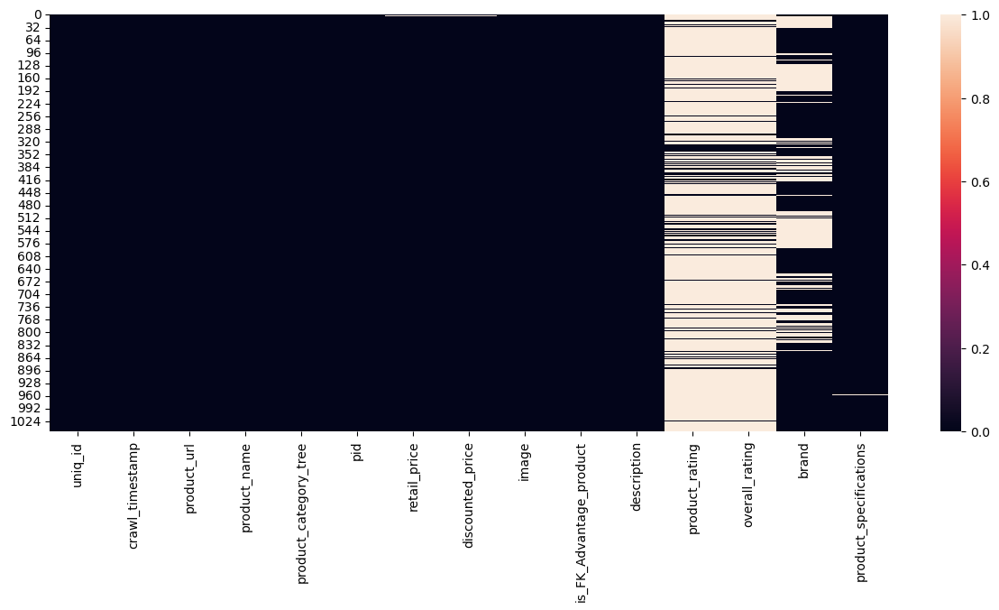

In [16]:
fig, ax = plt.subplots(1,1, figsize=(15,6))
sns.heatmap(df.isna())
plt.show()

In [17]:
print(df.duplicated().sum())

0


In [18]:
print(df.duplicated(subset='description').sum())

0


# 2. Analysis

## 2.1- Categories

In [19]:
for i in random.sample(range(df.shape[0]), 10):
    print(df.iloc[i]['product_category_tree'])

["Watches >> Wrist Watches >> Perucci Wrist Watches"]
["Baby Care >> Infant Wear >> Baby Boys' Clothes >> Combo Sets >> HEAVENLY Combo Sets >> HEAVENLY Dress Baby Boy's  Combo"]
["Watches >> Wrist Watches >> Maxima Wrist Watches"]
["Home Decor & Festive Needs >> Showpiece >> Bharatcraft Showpiece >> Bharatcraft Wall Hanging Of Lord Ganesha On A Cr..."]
["Baby Care >> Feeding & Nursing >> Bottles & Accessories >> Bottle Covers >> KOHL Bottle Covers >> KOHL Wine Bag Yellow (Yellow)"]
["Home Furnishing >> Bed Linen >> Blankets, Quilts & Dohars"]
["Beauty and Personal Care >> Hair Care >> Shampoos >> Kerastase Shampoos >> Kerastase Nutritive Bain Satin 1 Complete Nutrit..."]
["Computers >> Tablet Accessories >> Keyboards >> Saco Keyboards"]
["Home Furnishing >> Living >> Sofa Covers >> Swastik Sofa Covers >> Swastik Velvet Sofa Cover (Multicolor Pack of 10)"]
["Kitchen & Dining >> Coffee Mugs >> Rockmantra Coffee Mugs"]


On ne va garder extraire que 3 niveaux de catégories, les catégories deviennent trop précises ensuite.

In [20]:
categories = df['product_category_tree'].str.split('>>', expand=True)
df['cat1'] = categories[0].str.strip().str[2:] 
df['cat2'] = categories[1].str.strip()
df['cat3'] = categories[2].str.strip()
display(df.head(5))

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,cat1,cat2,cat3
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,NaN,NaN,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,NaN,NaN,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,NaN,NaN,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,NaN,NaN,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,NaN,NaN,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets


In [21]:
for i in random.sample(range(df.shape[0]), 10):
    print(df.iloc[i]['crawl_timestamp'])

2015-12-01 12:40:44 +0000
2015-12-01 06:13:00 +0000
2015-12-04 07:25:36 +0000
2016-06-10 22:31:19 +0000
2015-12-01 06:13:00 +0000
2015-12-01 12:40:44 +0000
2015-12-01 12:40:44 +0000
2015-12-31 09:19:31 +0000
2015-12-12 11:46:53 +0000
2015-12-01 06:13:00 +0000


## 2.2- Missing Brands

In [22]:
missing_brand = df[df['brand'].isnull()].copy()

In [23]:
for i in random.sample(range(missing_brand.shape[0]), 10):
    print(missing_brand.iloc[i]['product_name'])

Prithish We're All Mad Here Ceramic Mug
Prithish Hop Jump Skip Black Ceramic Mug
Fluid FU203-GR01 Analog-Digital Watch  - For Men
Nike Orange Combo Set
Go Bonjour Stainless Steel 9 pc Manicure Kit
D'Signer 681GM_WHT Analog Watch  - For Men, Boys
Prithish Merry Christmas Design 4 Double Color Ceramic Mug
Rockmantra Night City Ceramic Mug
Wild Stone Deodorant No-22 Combo Set
Lollipop Lane Tiddly Wink Safari Bath Set


In [24]:
missing_brand['brand'] = missing_brand['product_name'].str.split().str[0]

In [25]:
for i in random.sample(range(missing_brand.shape[0]), 10):
    print(missing_brand.iloc[i]['brand'])

Olvin
HMT
Mxofere
Only
Sonata
Noise
LUBA
Printland
Oxyglow
Wild


In [26]:
df.update(missing_brand)

In [27]:
print(df.isna().sum())

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating             889
overall_rating             889
brand                        0
product_specifications       1
cat1                         0
cat2                         0
cat3                         3
dtype: int64


# 3. Final dataframe and export

In [28]:
data = df[['uniq_id', 'product_name', 'image', 'description', 'brand', 'cat1', 'cat2', 'cat3']]

In [29]:
display(data.head(5))

,uniq_id,product_name,image,description,brand,cat1,cat2,cat3
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance,Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas,Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa,Baby Care,Baby Bath & Skin,Baby Bath Towels
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION,Home Furnishing,Bed Linen,Bedsheets
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print,Home Furnishing,Bed Linen,Bedsheets


In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   uniq_id       1050 non-null   object
 1   product_name  1050 non-null   object
 2   image         1050 non-null   object
 3   description   1050 non-null   object
 4   brand         1050 non-null   object
 5   cat1          1050 non-null   object
 6   cat2          1050 non-null   object
 7   cat3          1047 non-null   object
dtypes: object(8)
memory usage: 65.8+ KB


In [31]:
data.to_csv('data.csv', index=False)

# TEXT PROCESSING

In [32]:
warnings.filterwarnings("ignore")

In [33]:
# downloads
nltk.download('abc')
nltk.download('stopwords')
nltk.download('words')

[nltk_data] Downloading package abc to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package abc is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


True

In [34]:
# Version des bibliothèques utilisées
print('\n'.join(f'{m.__name__} - {m.__version__}' 
                for m in globals().values() 
                if getattr(m, '__version__', None)))

print("matplotlib - ", importlib.metadata.version('matplotlib'))

pandas - 2.0.3
numpy - 1.24.3
seaborn - 0.12.2
nltk - 3.8.1
PIL.Image - 9.4.0
cv2 - 4.9.0
tensorflow - 2.16.1
matplotlib -  3.7.2


In [35]:
# Initialize pandarallel
pandarallel.initialize(progress_bar=True,
                      nb_workers=6)

INFO: Pandarallel will run on 6 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


In [36]:
def process_text(doc,
                rejoin=False,
                lem_or_stem='stem',
                stop_words=None,
                rare_words=None,
                extra_words=None,
                min_len_word=3,
                force_is_alpha=True,
                eng_words=None) :
    """"
    positional arguments : 
    ----------------------
    doc : str : teh document (aka a text in str format) to process
    
    opt args : 
    ----------------------
    rejoin : bool : if True, return a string. Else, return the list of tokens
    lem_or_stem : str : if lem, lemmatize. else, stemming
    stop_words : list : a list of stop words to exclude
    rare_words : list : a list of rare words to exclude
    extra_words : list : a list of extra words to exclude
    min_len_word : int : the minimum length of words to keep
    force_is_alpha : int : if 1, exclude all tokens with a numeric character
    eng_words : list : list of english words
    
    return : 
    ----------------------
    a string (if rejoin is True) or a list of tokens
    """
    from nltk.stem import WordNetLemmatizer, PorterStemmer
    from nltk.tokenize import RegexpTokenizer
    
    
    # list_unique_words et stopwords
    if not rare_words:
        rare_words = []
    
    if not stop_words:
        stop_words = []
    
    if not extra_words:
        extra_words = []
    
    # lower
    doc = doc.lower().strip()
    
    # tokenize
    tokenizer = RegexpTokenizer(r"\w+")
    raw_tokens_list = tokenizer.tokenize(doc)
    
    # classic stopwords
    cleaned_tokens_list = [w for w in raw_tokens_list if w not in stop_words]
    
    # delete rare tokens 
    non_rare_tokens = [w for w in cleaned_tokens_list if w not in rare_words]
    
    # delete words with too few characters
    more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word]
    
    # delete non alphanumerical characters
    if force_is_alpha : 
        alpha_tokens =[w for w in more_than_N if w.isalpha()]
    else : 
        alpha_tokens = more_than_N
        
    # stem or lem
    if lem_or_stem == 'lem' :
        trans = WordNetLemmatizer()
        trans_text = [trans.lemmatize(i) for i in alpha_tokens]
    else : 
        trans = PorterStemmer()
        trans_text = [trans.stem(i) for i in alpha_tokens]
    
    # delete non english words
    if eng_words :
        engl_text = [i for i in trans_text if i in eng_words]
    else :
        engl_text = trans_text
    
    # delete extra_words
    final = [w for w in engl_text if w not in extra_words]
    
    # return list or string
    if rejoin : 
        return " ".join(final)
    
    return final

# 1- Loading Data

In [37]:
data = pd.read_csv('data.csv')

In [38]:
display(data.head(5))

,uniq_id,product_name,image,description,brand,cat1,cat2,cat3
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance,Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas,Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa,Baby Care,Baby Bath & Skin,Baby Bath Towels
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION,Home Furnishing,Bed Linen,Bedsheets
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print,Home Furnishing,Bed Linen,Bedsheets


In [39]:
print(data.shape)

(1050, 8)


# 2- Working on the entire corpus

## 2.1- Tokenizing corpus

In [40]:
raw_corpus = " ".join(data['description'].values)
print(raw_corpus)

Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you 

In [41]:
print(len(raw_corpus))

498561


In [42]:
list_stopwords = stopwords.words('english')
list_engwords = words.words()

In [43]:
corpus = process_text(raw_corpus,
                rejoin=False,
                lem_or_stem='stem',
                stop_words=list_stopwords,
                rare_words=None,
                extra_words=None,
                min_len_word=3,
                force_is_alpha=True,
                eng_words=list_engwords) 

In [44]:
print(len(corpus))

34580


In [45]:
tmp = pd.Series(corpus).value_counts()
print(tmp)

product    870
free       618
buy        581
ship       569
cash       564
          ... 
knock        1
tele         1
husband      1
cat          1
behind       1
Name: count, Length: 1932, dtype: int64


In [46]:
display(tmp.head(30))

product    870
free       618
buy        581
ship       569
cash       564
price      561
day        553
mug        457
design     401
color      380
watch      360
pack       342
type       325
set        323
cotton     299
box        297
print      290
sale       262
number     254
brand      247
detail     246
girl       242
inch       231
best       230
model      226
key        224
gift       220
fabric     211
cover      209
use        206
Name: count, dtype: int64

In [47]:
display(tmp.tail(30))

wand         1
snag         1
record       1
visit        1
superhero    1
lie          1
rural        1
spasm        1
treatment    1
mussel       1
inspect      1
drape        1
hurt         1
comb         1
caress       1
miner        1
author       1
alphabet     1
bake         1
word         1
cancel       1
grass        1
hop          1
sway         1
skip         1
knock        1
tele         1
husband      1
cat          1
behind       1
Name: count, dtype: int64

In [48]:
tmp.describe()

count    1932.000000
mean       17.898551
std        53.345498
min         1.000000
25%         2.000000
50%         4.000000
75%        12.000000
max       870.000000
Name: count, dtype: float64

## 2.2- Rare tokens

In [49]:
list_rare_words = tmp[tmp<=3]
list_rare_words = list(list_rare_words.index)
print(list_rare_words[:30])

['pigment', 'cocoa', 'render', 'park', 'next', 'aspect', 'burt', 'complement', 'flow', 'pile', 'construct', 'tuft', 'gender', 'except', 'wait', 'raga', 'data', 'master', 'shell', 'left', 'sober', 'site', 'jack', 'throughout', 'young', 'approach', 'radiant', 'thought', 'prayer', 'zipper']


In [50]:
print(len(list_rare_words))

957


## 2.3- Extra tokens

Tokens that are too generic to be useful to caracterize products

In [51]:
list_extra_tokens = ['product', 'free', 'buy', 'ship', 'cash', 'price', 'day', 'design', 'color', 'sale', 'number', 'brand',
 'detail', 'inch', 'best', 'model', 'size', 'perfect', 'made', 'great', 'ideal', 'one', 'discount']

# 3- Divide corpus by category

In [52]:
print(data['cat1'].unique())

['Home Furnishing' 'Baby Care' 'Watches' 'Home Decor & Festive Needs'
 'Kitchen & Dining' 'Beauty and Personal Care' 'Computers']


In [53]:
print(data['cat2'].unique())

['Curtains & Accessories' 'Baby Bath & Skin' 'Bed Linen' 'Wrist Watches'
 'Living Room Furnishing' 'Bath Linen' 'Candles & Fragrances'
 'Tableware & Cutlery' 'Lighting' 'JMD Home Furnishing' 'Infant Wear'
 "Kripa's Home Furnishing" 'Hair Care' 'Coffee Mugs' 'Network Components'
 'Tablet Accessories' 'Cookware' 'Laptop Accessories' 'Makeup'
 'Combos and Kits' 'Feeding & Nursing' 'Baby Bedding'
 'Kitchen & Dining Linen' 'Containers & Bottles'
 'Consumables & Disposables' 'Wall Decor & Clocks'
 'Table Decor & Handicrafts' 'Flowers, Plants & Vases' 'Software'
 'Showpieces' 'Furniture & Furnishings' 'Decorative Lighting & Lamps'
 'Baby Grooming' 'Computer Peripherals' 'Cushions, Pillows & Covers'
 'Storage' 'Health Care' 'Body and Skin Care' 'Kitchen Tools'
 'TRUE Home Decor & Festive Needs"]' 'Living' 'Showpiece'
 'Bar & Glassware' 'Fragrances' "Women's Hygiene"
 'Diapering & Potty Training' 'Strollers & Activity Gear'
 'Tidy Home Furnishing' 'Pressure Cookers & Pans' 'Bath and Spa' 'Lapto

In [54]:
data_furnishing = data[data['cat1'] == 'Home Furnishing']
data_baby = data[data['cat1'] == 'Baby Care']
data_watches = data[data['cat1'] == 'Watches']
data_decor = data[data['cat1'] == 'Home Decor & Festive Needs']
data_kitchen = data[data['cat1'] == 'Kitchen & Dining']
data_beauty = data[data['cat1'] == 'Beauty and Personal Care']
data_computers = data[data['cat1'] == 'Computers']

In [55]:
print("data_furnishing shape", data_furnishing.shape)
print("data_baby shape", data_baby.shape)
print("data_watches shape", data_watches.shape)
print("data_decor shape", data_decor.shape)
print("data_kitchen shape", data_kitchen.shape)
print("data_beauty shape", data_beauty.shape)
print("data_computers shape", data_computers.shape)

data_furnishing shape (150, 8)
data_baby shape (150, 8)
data_watches shape (150, 8)
data_decor shape (150, 8)
data_kitchen shape (150, 8)
data_beauty shape (150, 8)
data_computers shape (150, 8)


Les catégories sont exactement équivalentes, pas de stratification requise.

In [56]:
corpus_furnishing = " ".join(data_furnishing['description'])
corpus_baby = " ".join(data_baby['description'])
corpus_watches = " ".join(data_watches['description'])
corpus_decor = " ".join(data_decor['description'])
corpus_kitchen = " ".join(data_kitchen['description'])
corpus_beauty = " ".join(data_beauty['description'])
corpus_computers = " ".join(data_computers['description'])

In [57]:
corpus_furnishing = process_text(corpus_furnishing,
                rejoin=False,
                lem_or_stem='stem',
                stop_words=list_stopwords,
                rare_words=list_rare_words,
                extra_words=list_extra_tokens,
                min_len_word=3,
                force_is_alpha=True,
                eng_words=list_engwords)
print('corpus_furnishing processed')

corpus_baby = process_text(corpus_baby,
                rejoin=False,
                lem_or_stem='stem',
                stop_words=list_stopwords,
                rare_words=list_rare_words,
                extra_words=list_extra_tokens,
                min_len_word=3,
                force_is_alpha=True,
                eng_words=list_engwords)
print('corpus_baby processed')

corpus_watches = process_text(corpus_watches,
                rejoin=False,
                lem_or_stem='stem',
                stop_words=list_stopwords,
                rare_words=list_rare_words,
                extra_words=list_extra_tokens,
                min_len_word=3,
                force_is_alpha=True,
                eng_words=list_engwords)
print('corpus_watches processed')

corpus_decor = process_text(corpus_decor,
                rejoin=False,
                lem_or_stem='stem',
                stop_words=list_stopwords,
                rare_words=list_rare_words,
                extra_words=list_extra_tokens,
                min_len_word=3,
                force_is_alpha=True,
                eng_words=list_engwords)
print('corpus_decor processed')

corpus_kitchen = process_text(corpus_kitchen,
                rejoin=False,
                lem_or_stem='stem',
                stop_words=list_stopwords,
                rare_words=list_rare_words,
                extra_words=list_extra_tokens,
                min_len_word=3,
                force_is_alpha=True,
                eng_words=list_engwords)
print('corpus_kitchen processed')

corpus_beauty = process_text(corpus_beauty,
                rejoin=False,
                lem_or_stem='stem',
                stop_words=list_stopwords,
                rare_words=list_rare_words,
                extra_words=list_extra_tokens,
                min_len_word=3,
                force_is_alpha=True,
                eng_words=list_engwords)
print('corpus_beauty processed')

corpus_computers = process_text(corpus_computers,
                rejoin=False,
                lem_or_stem='stem',
                stop_words=list_stopwords,
                rare_words=list_rare_words,
                extra_words=list_extra_tokens,
                min_len_word=3,
                force_is_alpha=True,
                eng_words=list_engwords)
print('corpus_computers processed')

corpus_furnishing processed
corpus_baby processed
corpus_watches processed
corpus_decor processed
corpus_kitchen processed
corpus_beauty processed
corpus_computers processed


In [58]:
corpora = [corpus_furnishing, corpus_baby, corpus_watches, corpus_decor, corpus_kitchen, corpus_beauty, corpus_computers]
corpus_names = ['corpus_furnishing', 'corpus_baby', 'corpus_watches', 'corpus_decor', 'corpus_kitchen', 'corpus_beauty', 'corpus_computers']

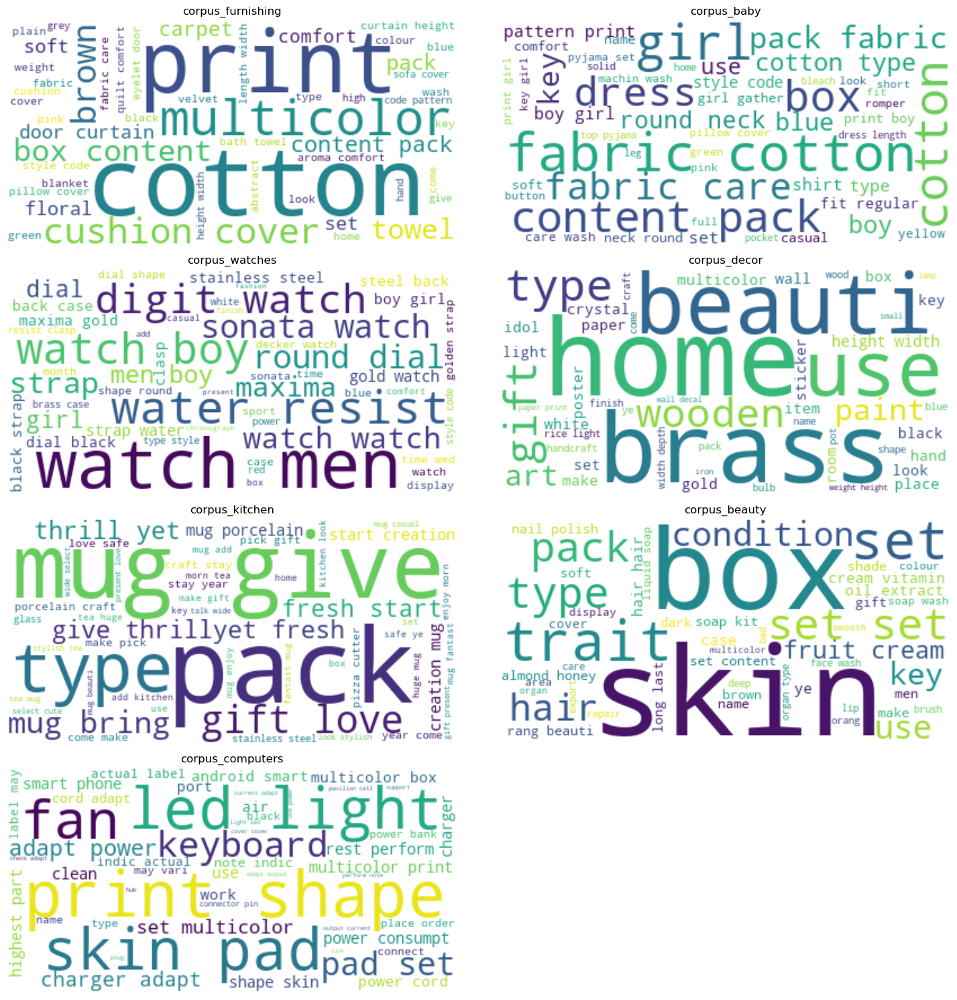

In [59]:
def generate_and_display_wordcloud(corpus, title):
    wordcloud = WordCloud(background_color='white', max_words=50).generate(" ".join(corpus))
    plt.subplot(4, 2, i+1)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')

# Initialize subplot for word clouds
plt.figure(figsize=(15, 15))

# Iterate over each corpus and generate/display word cloud
for i, corpus in enumerate(corpora):
    corpus_name = corpus_names[i]
    generate_and_display_wordcloud(corpus, corpus_name)

plt.tight_layout()
plt.show()

Our categories are well defined by their words.

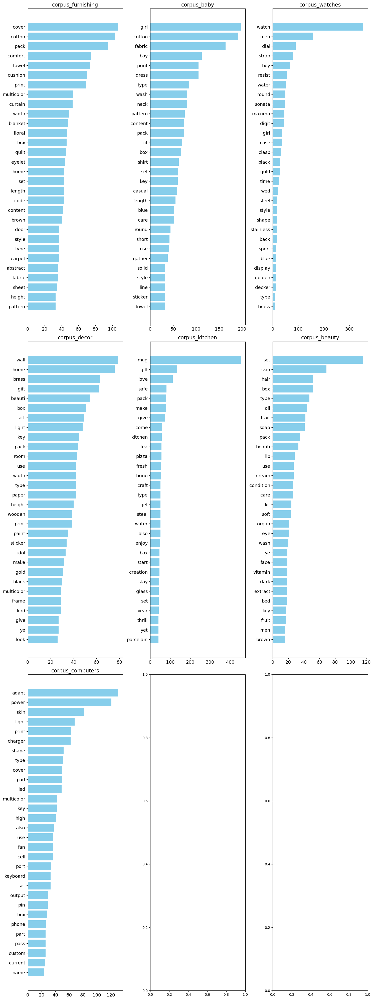

In [60]:
fig, axes = plt.subplots(3, 3, figsize=(15, 40))

# Iterate over corpora and plot each one
for i, corpus in enumerate(corpora):
    # Get the top 30 most frequent words
    top_words = Counter(corpus).most_common(30)
    words, frequencies = zip(*top_words)
    words = list(reversed(words))
    frequencies = list(reversed(frequencies))
    
    # Determine subplot position
    row = i // 3
    col = i % 3
    
    # Plotting
    ax = axes[row, col]
    ax.barh(words, frequencies, color='skyblue')
    ax.set_title(corpus_names[i], fontsize=15)  # Set the title from corpus_names
    ax.tick_params(labelsize=13)  # Rotate x-axis labels for better readability

# Adjust layout
plt.tight_layout()
plt.show()

# 4. Final Clean

In [61]:
data['clean_description'] = data['description'].parallel_apply(process_text,
                                                               rejoin=True,
                                                               lem_or_stem='stem',
                                                               stop_words=list_stopwords,
                                                               rare_words=list_rare_words,
                                                               extra_words=list_extra_tokens,
                                                               min_len_word=3,
                                                               force_is_alpha=True,
                                                               eng_words=list_engwords)

In [62]:
display(data)

,uniq_id,product_name,image,description,brand,cat1,cat2,cat3,clean_description
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance,Home Furnishing,Curtains & Accessories,Curtains,key multicolor abstract eyelet door curtain fl...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas,Baby Care,Baby Bath & Skin,Baby Bath Towels,cotton bath towel bath towel red yellow blue b...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa,Baby Care,Baby Bath & Skin,Baby Bath Towels,key cotton face towel set small height cotton ...
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION,Home Furnishing,Bed Linen,Bedsheets,key royal fashion cotton print king royal wed ...
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print,Home Furnishing,Bed Linen,Bedsheets,key print cotton floral king cotton print cott...
...,...,...,...,...,...,...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc,Oren Empower Extra Large Self Adhesive Sticker,958f54f4c46b53c8a0a9b8167d9140bc.jpg,Oren Empower Extra Large Self Adhesive Sticker...,Oren Empower,Baby Care,Baby & Kids Gifts,Stickers,extra self sticker pack sticker use big wall t...
1046,fd6cbcc22efb6b761bd564c28928483c,Wallmantra Large Vinyl Sticker Sticker,fd6cbcc22efb6b761bd564c28928483c.jpg,Wallmantra Large Vinyl Sticker Sticker (Pack o...,Wallmantra,Baby Care,Baby & Kids Gifts,Stickers,vinyl sticker sticker pack bring home wall art...
1047,5912e037d12774bb73a2048f35a00009,Uberlyfe Extra Large Pigmented Polyvinyl Films...,5912e037d12774bb73a2048f35a00009.jpg,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,Uberlyfe,Baby Care,Baby & Kids Gifts,Stickers,extra pigment film import sticker extra pigmen...
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,Wallmantra Medium Vinyl Sticker Sticker,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,Wallmantra,Baby Care,Baby & Kids Gifts,Stickers,medium vinyl sticker sticker medium vinyl stic...


In [63]:
list_labels = data['cat1'].unique()

label_encoder = LabelEncoder()

data['label'] = label_encoder.fit_transform(data['cat1'])

In [64]:
category_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

mapping = pd.DataFrame(list(category_mapping.items()), columns=['Category', 'Encoded Value'])

display(mapping)

,Category,Encoded Value
0,Baby Care,0
1,Beauty and Personal Care,1
2,Computers,2
3,Home Decor & Festive Needs,3
4,Home Furnishing,4
5,Kitchen & Dining,5
6,Watches,6


In [65]:
list_labels = mapping['Category'].tolist()

In [66]:
data_T = data

In [67]:
l_cat = list(set(data_T['cat1']))
print("catégories : ", l_cat)
y_cat_num = [(1-l_cat.index(data_T.iloc[i]['cat1'])) for i in range(len(data_T))]

catégories :  ['Baby Care', 'Home Furnishing', 'Home Decor & Festive Needs', 'Beauty and Personal Care', 'Computers', 'Kitchen & Dining', 'Watches']


In [68]:
data_T['length'] = data_T['clean_description'].str.split().str.len()

In [69]:
data_T['length'].describe()

count    1050.000000
mean       24.191429
std        29.029529
min         0.000000
25%         4.000000
50%        12.000000
75%        36.000000
max       177.000000
Name: length, dtype: float64

# Fonctions

In [70]:
import time


# TSNE computing, clustering, and ARI between true labels and predicted labels
def ARI_fct(features) :
    time1 = time.time()
    num_labels=len(l_cat)
    tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                 init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # post TSNE clustering
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_


# TSNE visualization
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI) :
    fig = plt.figure(figsize=(15,6))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=y_cat_num, cmap='Set1', marker='o', s=35)
    ax.legend(handles=scatter.legend_elements()[0], labels=l_cat, loc="best", title="Categorie")
    plt.title('Plot of porducts by true category')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='Set1', marker='o', s=35)
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters")
    plt.title('Plot of products by predicted labels')
    
    plt.show()
    print("ARI : ", ARI)


In [71]:
from scipy.optimize import linear_sum_assignment
import numpy as np

def _make_cost_m(cm):
    s = np.max(cm)
    return (- cm + s)

In [72]:
def visualisations(features):
    
    from sklearn import manifold, decomposition
    
    feat_pca = features

    
    #TSNE
    temps1 = time.time()
    tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=3000, init='random', random_state=6, early_exaggeration = 20)
    X_tsne = tsne.fit_transform(feat_pca)
    duration1=time.time()-temps1
    print("temps de T-SNE : ", "%15.2f" % duration1, "secondes")
    
    print(' ')
    print('------------------')
    print(' ')
    
    # Affichage TSNE
    
    df_tsne = pd.DataFrame(X_tsne, columns=['tsne1', 'tsne2'])
    df_tsne["class"] = data_T["cat1"]

    plt.figure(figsize=(8,5))
    sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="class",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

    plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
    plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
    plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
    plt.legend(prop={'size': 14}, bbox_to_anchor=(1.05, 1), loc='upper left') 

    plt.show()
    
    print(' ')
    print('------------------')
    print(' ')
    
    # Agglomerative clustering
    from sklearn.cluster import AgglomerativeClustering
    cls = AgglomerativeClustering(n_clusters=7)
    cls.fit(X_tsne)
    
    # Display TSNE with predicted labels
    df_tsne["cluster"] = cls.labels_

    plt.figure(figsize=(8,5))
    sns.scatterplot(
        x="tsne1", y="tsne2",
        hue="cluster",
        palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
        data=df_tsne,
        legend="brief")

    plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
    plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
    plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
    plt.legend(prop={'size': 14}) 

    plt.show()

    labels = data_T["label"]
    print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))
    
    print(' ')
    print('------------------')
    print(' ')
    
    conf_mat = metrics.confusion_matrix(labels, cls.labels_)
    print('Confusion matrix, désordonnée :')
    print(conf_mat)
    
    print(' ')
    print('------------------')
    print(' ')
    
    cm = conf_mat
    indexes = linear_sum_assignment(_make_cost_m(cm))
    js = [e[1] for e in sorted(zip(indexes[0], indexes[1]), key=lambda x: x[0])]
    cm2 = cm[:, js]
    print('Confusion matrix, ordonnée :')
    print(cm2)

    print(' ')
    print('------------------')
    print(' ')
    
    print('Matrice de confusion')
    df_cm = pd.DataFrame(cm2, index = [label for label in list_labels],
                  columns = [i for i in "0123456"])
    plt.figure(figsize = (8,5))
    sns.heatmap(df_cm, annot=True, fmt='d', cmap="Blues")
    

# 5. Bag of word - Tf-idf

In [73]:
# création du bag of words (CountVectorizer et Tf-idf)

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)
ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'clean_description'
cv_fit = cvect.fit(data_T[feat])
ctf_fit = ctf.fit(data_T[feat])

cv_transform = cvect.transform(data_T[feat])  
ctf_transform = ctf.transform(data_T[feat])  

## Bag of words

temps de T-SNE :             7.09 secondes
 
------------------
 


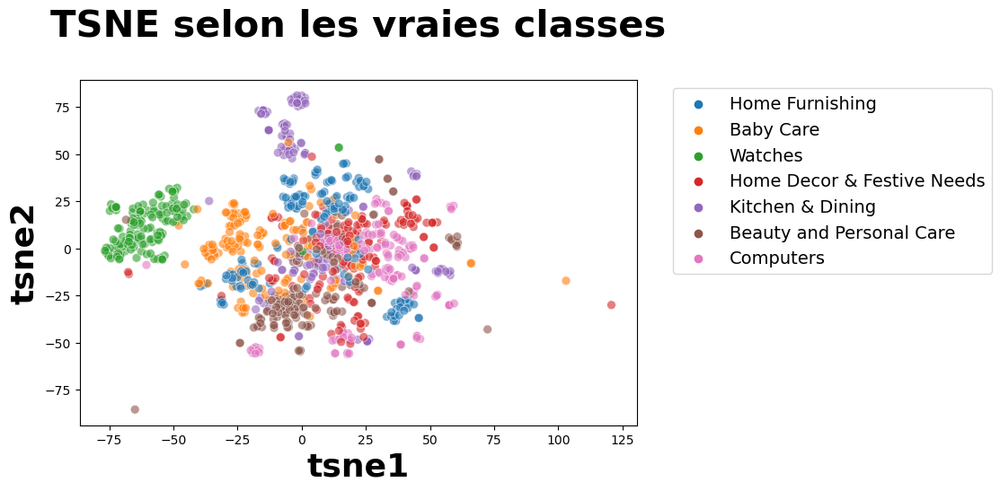

 
------------------
 


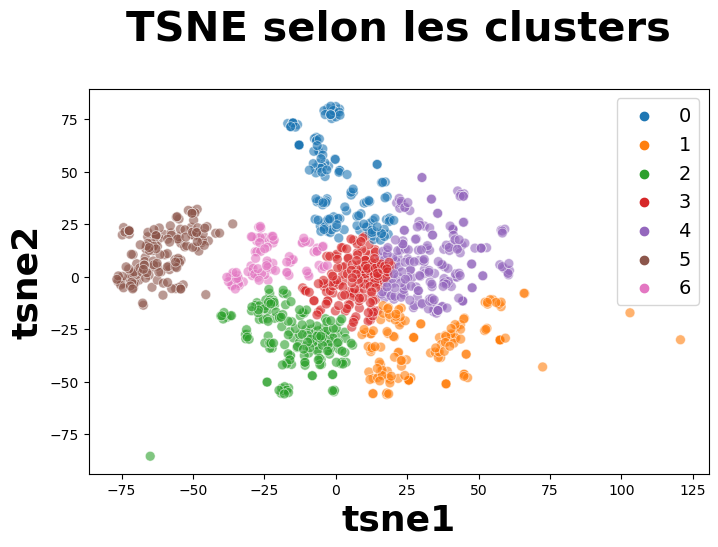

ARI :  0.2947373294739664
 
------------------
 
Confusion matrix, désordonnée :
[[  8   6  32  21   7   3  73]
 [  2  25  80  25  17   1   0]
 [  0  38  10  25  75   1   1]
 [  2  23  11  42  65   2   5]
 [ 63  27  34   9  14   0   3]
 [ 75  17   8  37  12   1   0]
 [  2   0   0   1   0 147   0]]
 
------------------
 
Confusion matrix, ordonnée :
[[ 73  32   7  21   6   8   3]
 [  0  80  17  25  25   2   1]
 [  1  10  75  25  38   0   1]
 [  5  11  65  42  23   2   2]
 [  3  34  14   9  27  63   0]
 [  0   8  12  37  17  75   1]
 [  0   0   0   1   0   2 147]]
 
------------------
 
Matrice de confusion


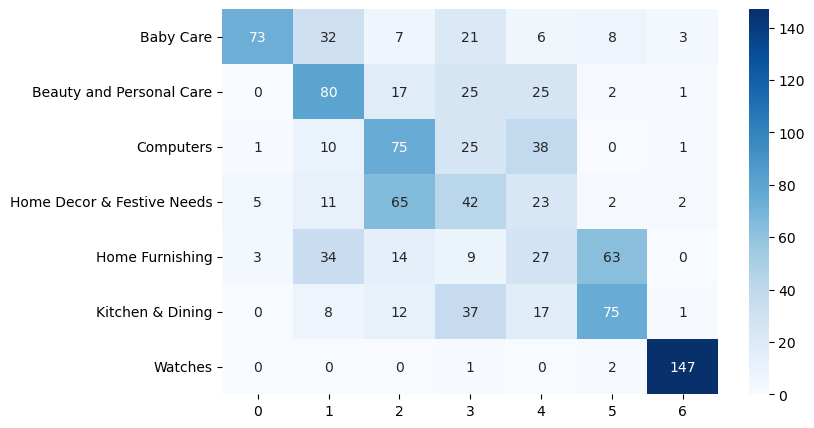

In [74]:
visualisations(cv_transform)

## TFidf

temps de T-SNE :             6.75 secondes
 
------------------
 


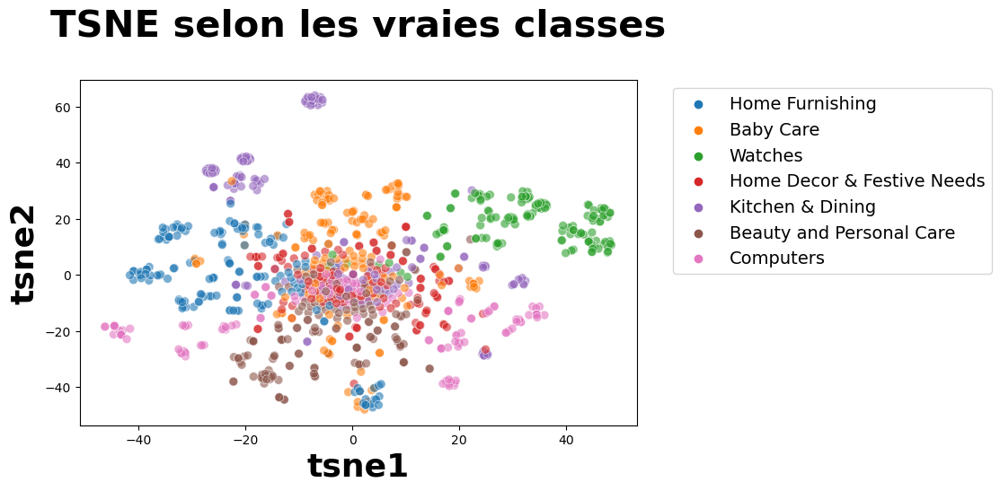

 
------------------
 


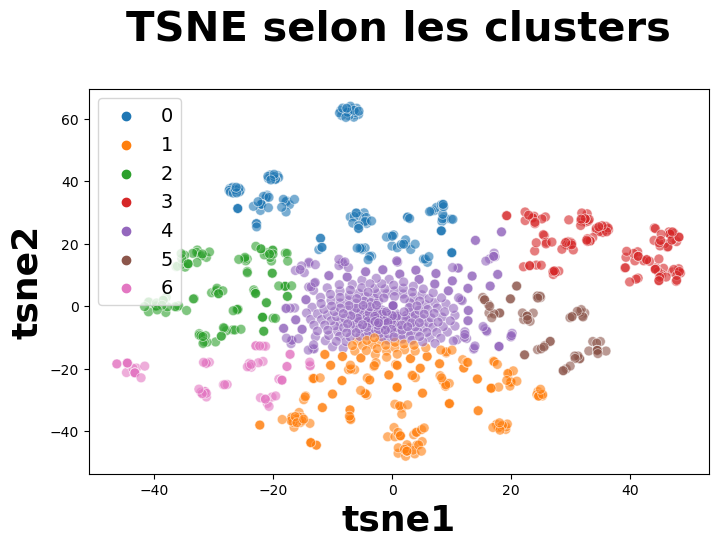

ARI :  0.25293910943568426
 
------------------
 
Confusion matrix, désordonnée :
[[ 61  25   7   0  47  10   0]
 [  0 100   0   1  35   0  14]
 [  0  28   0   0  52  27  43]
 [  7  17   7   0 107  10   2]
 [  2  22  92   0  29   0   5]
 [ 68  10   5   1  49  17   0]
 [  0   0   0 128  22   0   0]]
 
------------------
 
Confusion matrix, ordonnée :
[[ 61  25   0  47   7  10   0]
 [  0 100  14  35   0   0   1]
 [  0  28  43  52   0  27   0]
 [  7  17   2 107   7  10   0]
 [  2  22   5  29  92   0   0]
 [ 68  10   0  49   5  17   1]
 [  0   0   0  22   0   0 128]]
 
------------------
 
Matrice de confusion


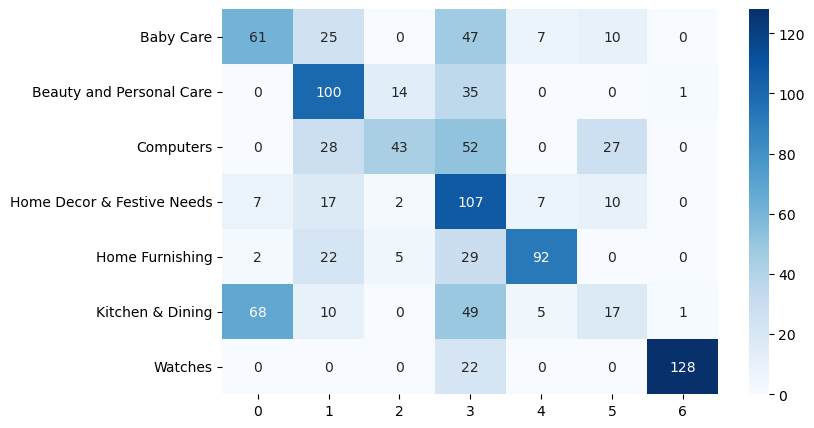

In [75]:
visualisations(ctf_transform)

# 6. Word2Vec

In [76]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

## 6.1- Création du modèle Word2Vec

In [77]:
w2v_size=300
w2v_window=5
w2v_min_count=1
w2v_epochs=100
maxlen = 177 # adapt to length of sentences
sentences = data_T['clean_description'].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [78]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                                workers=multiprocessing.cpu_count())
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 1266
Word2Vec trained


In [79]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 1267


## 6.2- Création de la matrice d'embedding

In [80]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 300
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (1267, 300)


## 6.3- Création du modèle d'embedding

In [81]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix])(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 177)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Embedding)           │ (None, 177, 300)       │       380,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ (None, 300)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 380,100 (1.45 MB)

 Trainable params: 380,100 (1.45 MB)

 Non-trainable params: 0 (0.00 B)

## 6.4- Exécution du modèle

In [82]:
embeddings = embed_model.predict(x_sentences)
print(embeddings.shape)

33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
(1050, 300)


temps de T-SNE :             6.88 secondes
 
------------------
 


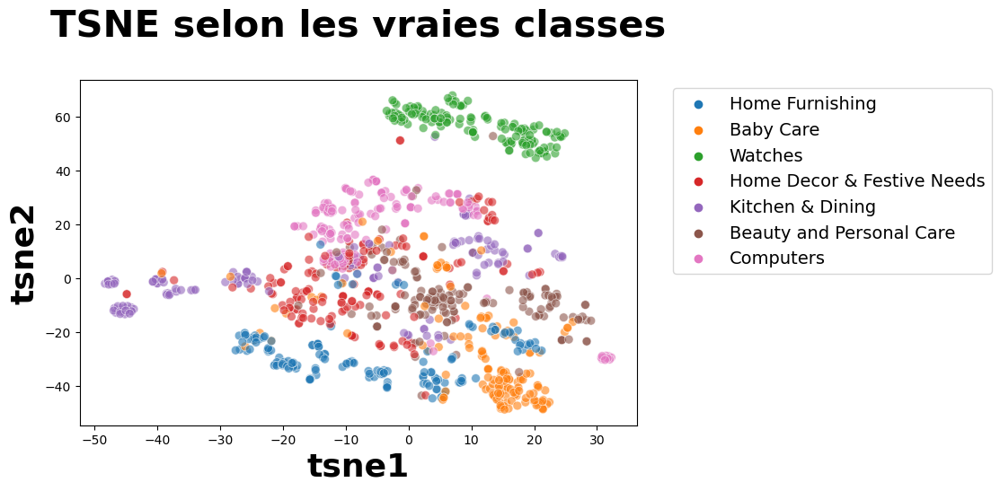

 
------------------
 


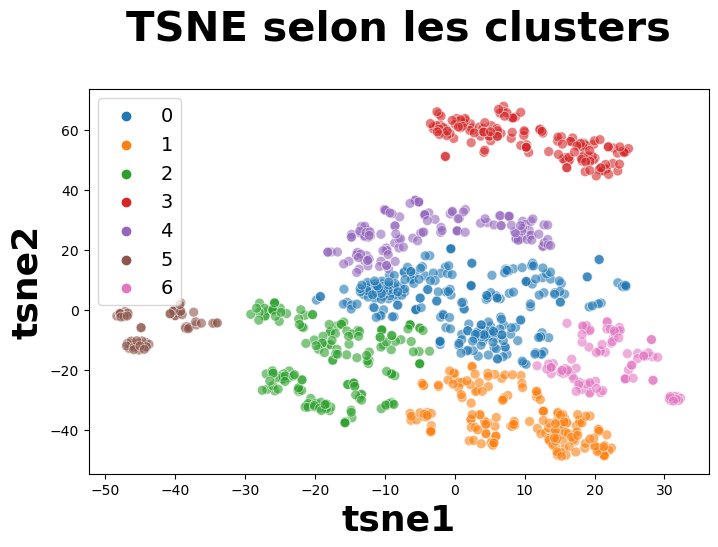

ARI :  0.35039421777266955
 
------------------
 
Confusion matrix, désordonnée :
[[ 24  96  11   0   1   1  17]
 [ 87   7   8   1   2   0  45]
 [ 29   2   0   0 109   0  10]
 [ 52  12  64   2  16   4   0]
 [ 12  47  70   0   1   0  20]
 [ 59   9  19   1   7  55   0]
 [  0   0   0 150   0   0   0]]
 
------------------
 
Confusion matrix, ordonnée :
[[ 96  24   1  11  17   1   0]
 [  7  87   2   8  45   0   1]
 [  2  29 109   0  10   0   0]
 [ 12  52  16  64   0   4   2]
 [ 47  12   1  70  20   0   0]
 [  9  59   7  19   0  55   1]
 [  0   0   0   0   0   0 150]]
 
------------------
 
Matrice de confusion


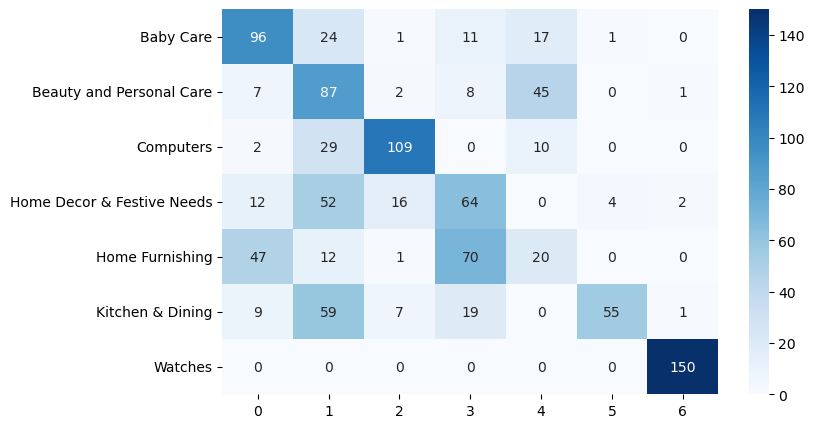

In [83]:
visualisations(embeddings)

# 7. BERT

In [84]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import os

In [85]:
import transformers

In [86]:
from transformers import *

In [87]:
os.environ["TF_KERAS"]='1'

In [88]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.16.1
2.16.1
Num GPUs Available:  0
False


## Fonctions communes

In [89]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

## BERT HuggingFace

### 'bert-base-uncased'

In [90]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
sentences = data_T['clean_description'].to_list()

loading configuration file config.json from cache at C:\Users\LENOVO\.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.40.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading weights file model.safetensors from cache at C:\Users\LENOVO\.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8

Loaded 109,482,240 parameters in the TF 2.0 model.
Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on

In [91]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

loading configuration file config.json from cache at C:\Users\LENOVO\.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.40.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\LENOVO\.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\vocab


1/1 [==============================] - 0s 419ms/step
temps traitement :  69.0


temps de T-SNE :             8.63 secondes
 
------------------
 


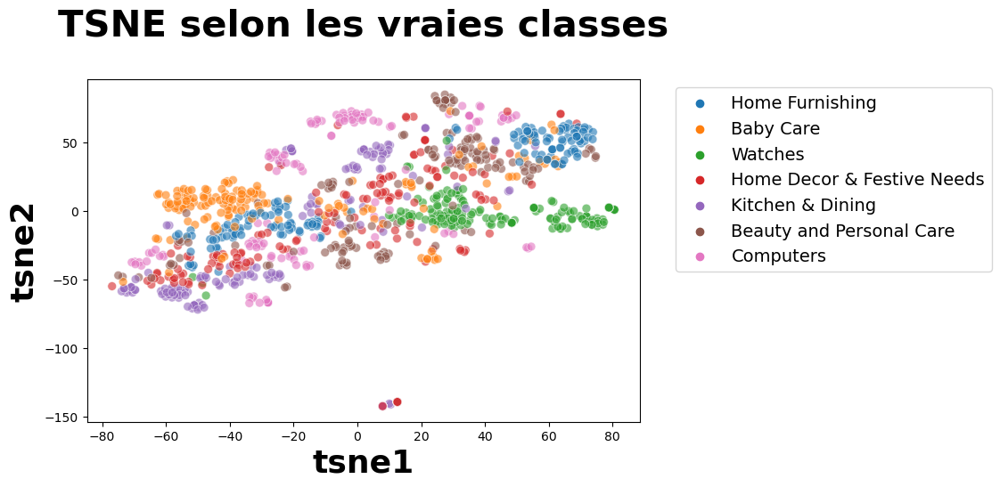

 
------------------
 


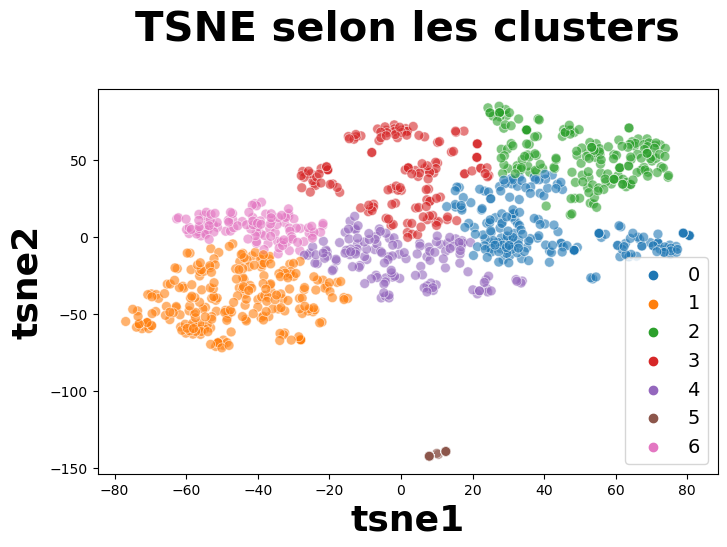

ARI :  0.20991173642909255
 
------------------
 
Confusion matrix, désordonnée :
[[ 10  16  19   4  19   0  82]
 [ 24  19  52  16  35   2   2]
 [  7  46  22  48   4  21   2]
 [ 19  49   7  33  26  16   0]
 [  0  30  75   0  26   0  19]
 [  4  77   7  40  13   9   0]
 [134   3   1   0  12   0   0]]
 
------------------
 
Confusion matrix, ordonnée :
[[ 82  19   4   0  19  16  10]
 [  2  35  16   2  52  19  24]
 [  2   4  48  21  22  46   7]
 [  0  26  33  16   7  49  19]
 [ 19  26   0   0  75  30   0]
 [  0  13  40   9   7  77   4]
 [  0  12   0   0   1   3 134]]
 
------------------
 
Matrice de confusion


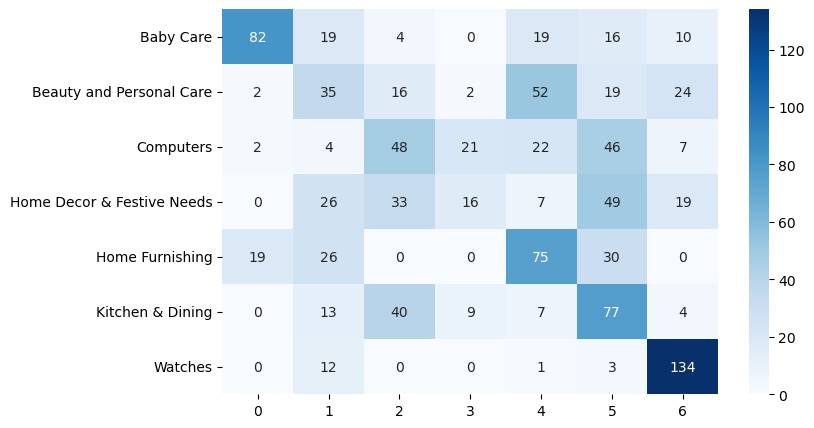

In [92]:
visualisations(features_bert)

# USE - Universal Sentence Encoder

In [93]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import transformers
from transformers import *

os.environ["TF_KERAS"]='1'

In [94]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.16.1
2.16.1
Num GPUs Available:  0
False


In [95]:
import tensorflow_hub as hub

In [96]:
module_url = "https://tfhub.dev/google/universal-sentence-encoder/4"
embed = hub.load(module_url)

In [97]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [98]:
batch_size = 10
sentences = data_T['clean_description'].to_list()

In [99]:
features_USE = feature_USE_fct(sentences, batch_size)

temps de T-SNE :             6.61 secondes
 
------------------
 


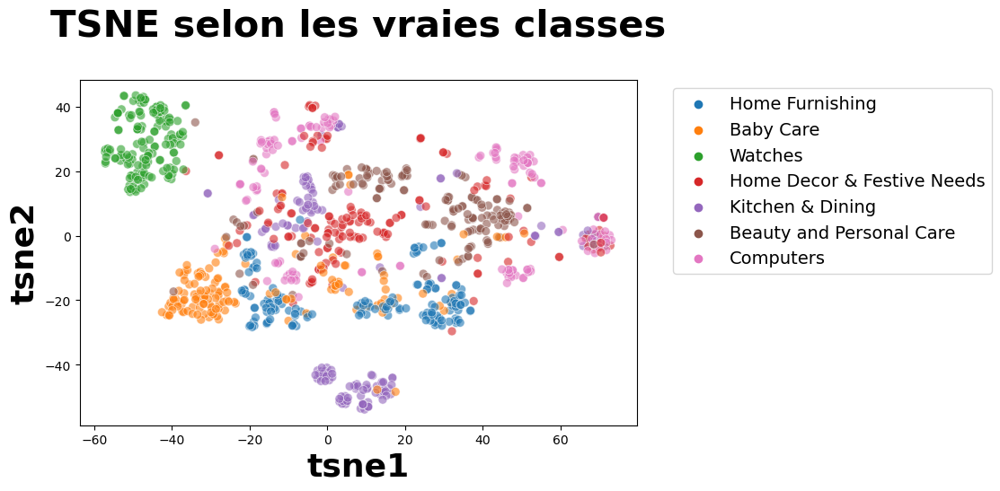

 
------------------
 


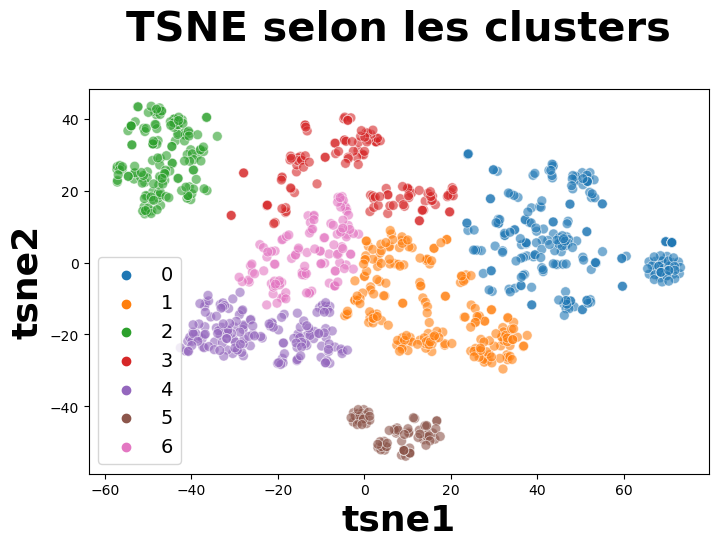

ARI :  0.3507328628340833
 
------------------
 
Confusion matrix, désordonnée :
[[  6  36   0   3  94   2   9]
 [ 82   5   1  45   3   0  14]
 [ 76   4   0  52  13   0   5]
 [ 42  65   1  17   2   0  23]
 [  3  84   0   0  47   0  16]
 [ 19   4   0   9   0  74  44]
 [  0   0 150   0   0   0   0]]
 
------------------
 
Confusion matrix, ordonnée :
[[ 94   6   3   9  36   2   0]
 [  3  82  45  14   5   0   1]
 [ 13  76  52   5   4   0   0]
 [  2  42  17  23  65   0   1]
 [ 47   3   0  16  84   0   0]
 [  0  19   9  44   4  74   0]
 [  0   0   0   0   0   0 150]]
 
------------------
 
Matrice de confusion


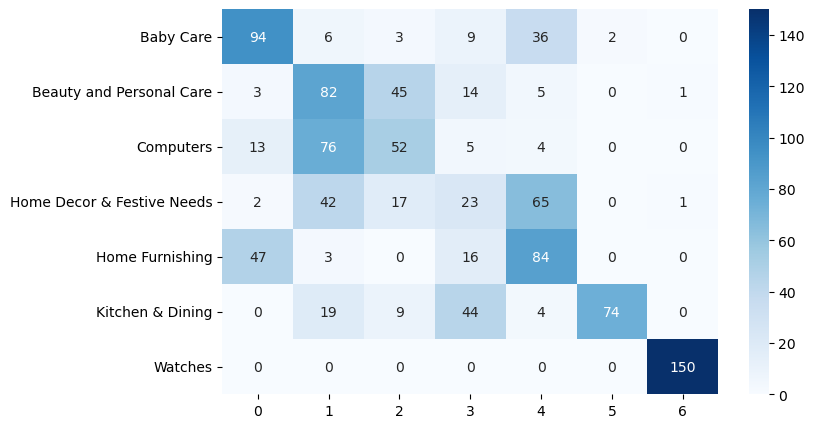

In [100]:
visualisations(features_USE)

In [101]:
np.save('features_USE.npy', features_USE)

# IMAGE PROCESSING

# 1. Données

## 1.1 Chargement des données

In [102]:
data = pd.read_csv('data.csv')

In [103]:
data['image_path'] = 'Images/' + data['image']
data = data[['uniq_id', 'image_path', 'cat1']].copy()

## 1.2 Analyse

In [104]:
display(data.groupby('cat1')['uniq_id'].nunique())

cat1
Baby Care                     150
Beauty and Personal Care      150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Kitchen & Dining              150
Watches                       150
Name: uniq_id, dtype: int64

In [105]:
random = data.sample(5)['image_path'].tolist()

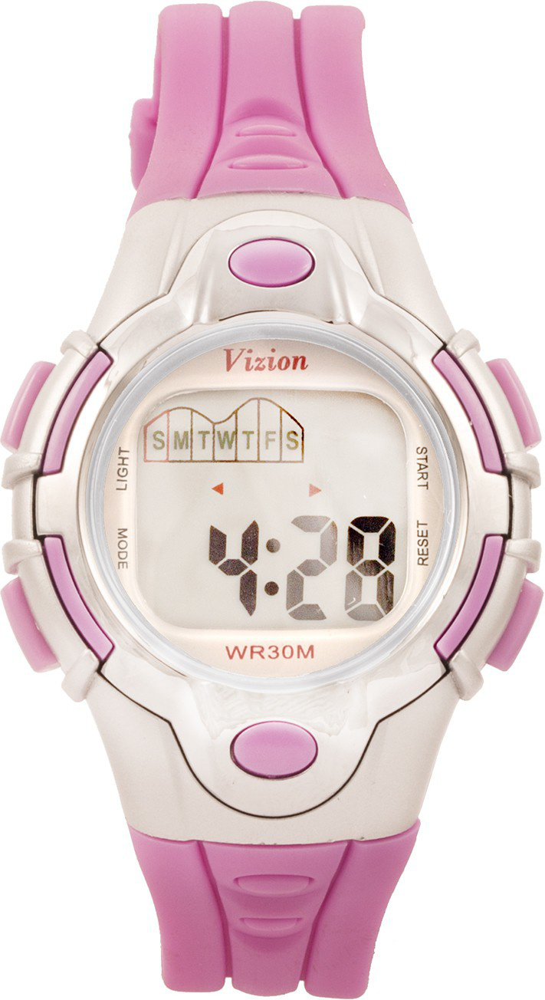

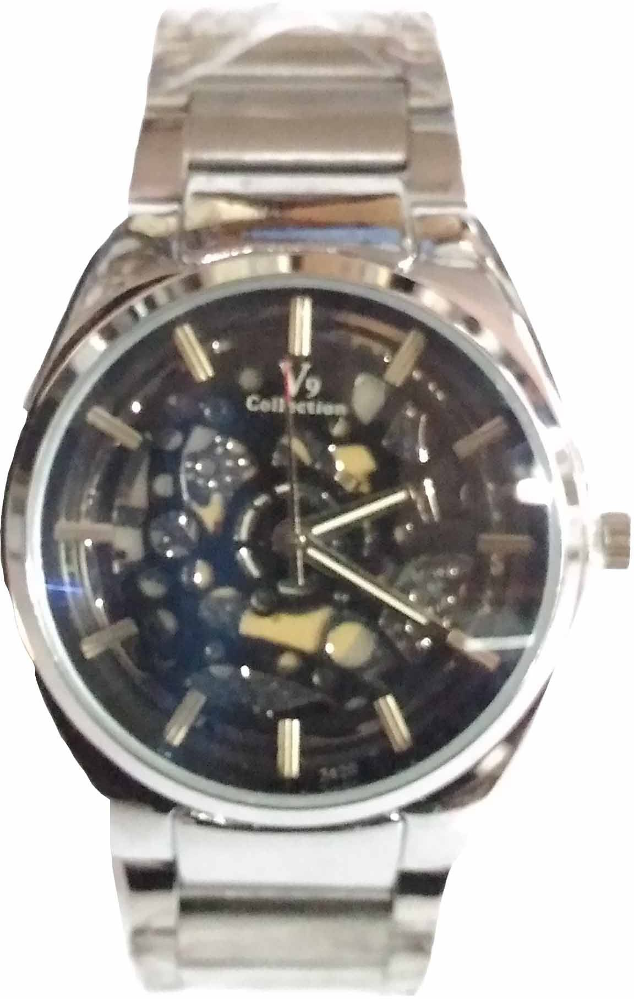

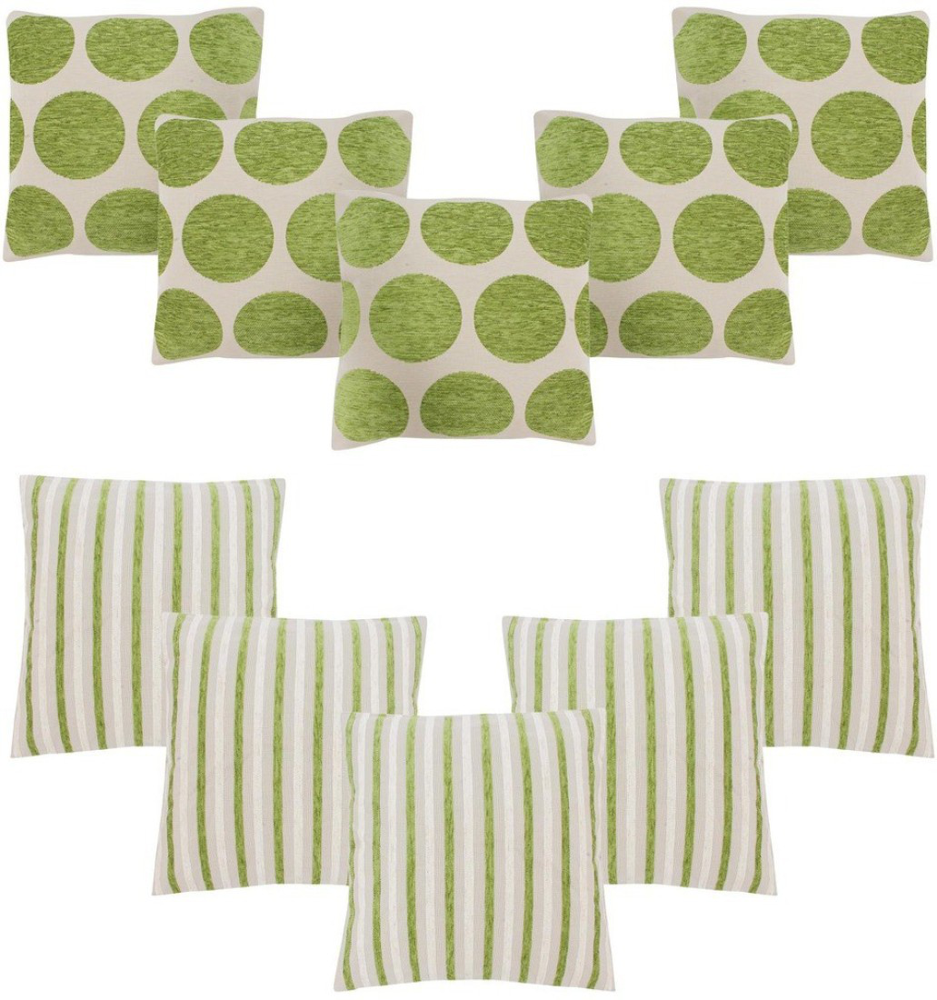

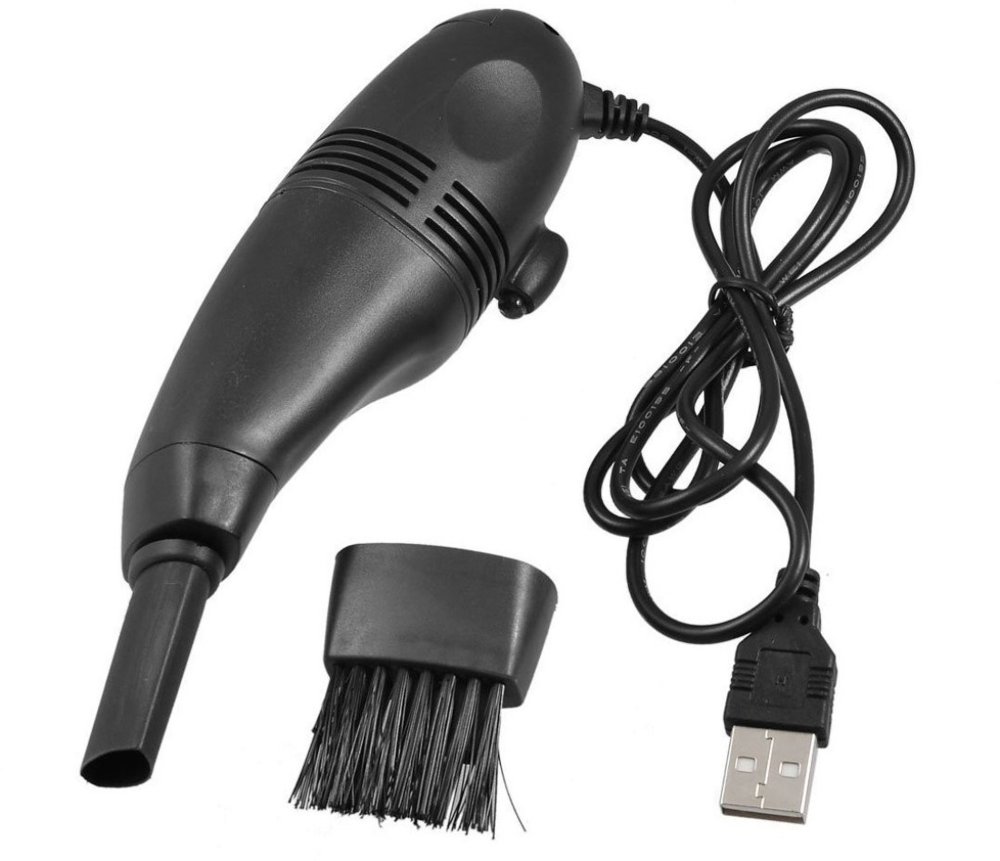

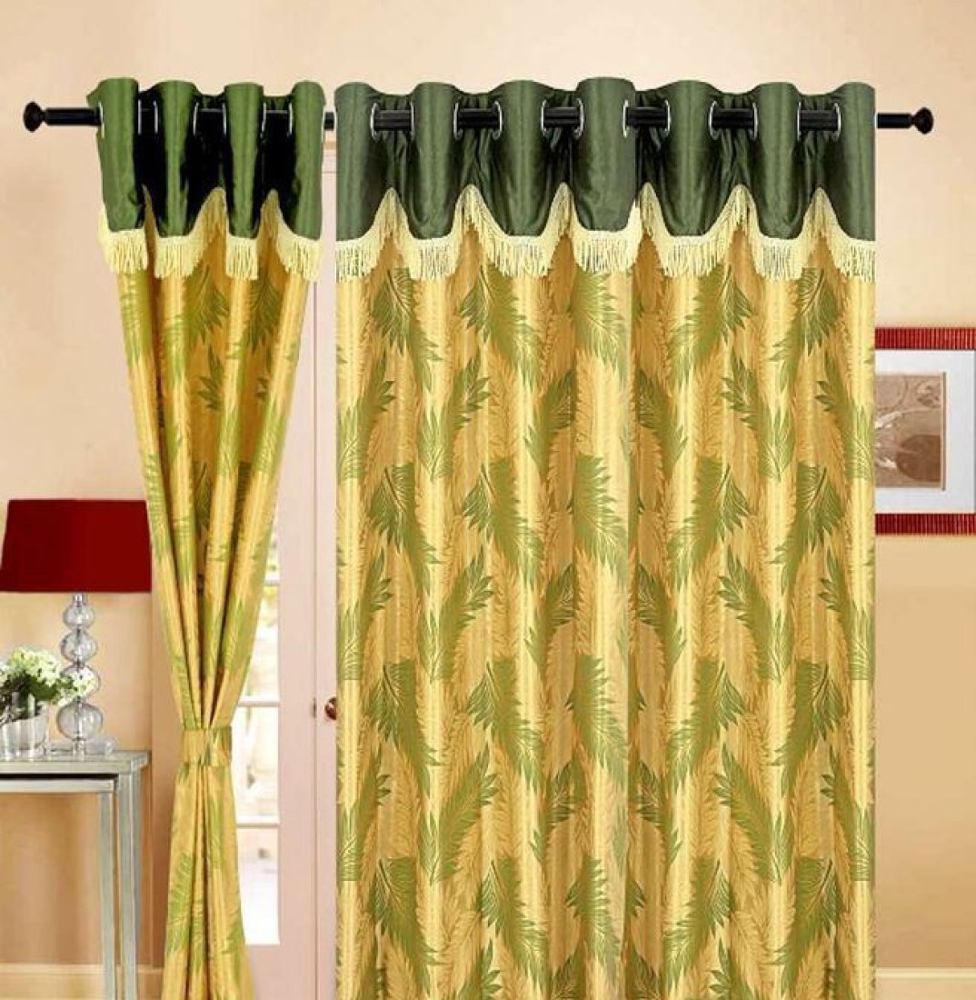

In [106]:
for path in random:
    img = Image.open(path)
    display(img)

In [107]:
print(random)

['Images/b52073e7ed9c00c4108cae4eb0c49c1a.jpg', 'Images/08613e8b27838b997069b1fedb6e88d2.jpg', 'Images/d218c32df572e82db50faecd62179db2.jpg', 'Images/621a88993a7033df3440ec816c2e386f.jpg', 'Images/6eaa9bd9e9285d77891bb76d30e6ebe7.jpg']


Il va falloir travailler les images:  
- redimensionner  
- convertir en greyscale
- denoise

REMARQUES :   
Les images sont hétérogènes : parfois elles présentent un fond, parfois non; parfois elles présentent un seul objet, parfois plusieurs. Parfois les objets sont dans un contexte, parfois non. 

## 1.3 Travail sur une image

In [108]:
img = Image.open('Images/112a8a56ee40ee31ea06fb7ff23b5c25.jpg').convert('L')

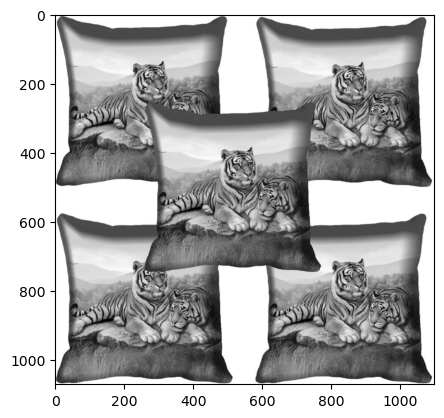

In [109]:
plt.imshow(img, cmap='gray')
plt.show()

In [110]:
def disp_img_hist(image):

    plt.figure(figsize=(50, 10))
    plt.subplot(131)
    plt.imshow(image, cmap='gray')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(132)
    plt.title('Histogramme de répartition des pixels', fontsize=30)
    hist, bins = np.histogram(np.array(image).flatten(), bins=256)
    plt.bar(range(len(hist[0:255])), hist[0:255])
    plt.xlabel('Niveau de gris', fontsize=30)
    plt.ylabel('Nombre de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.show()

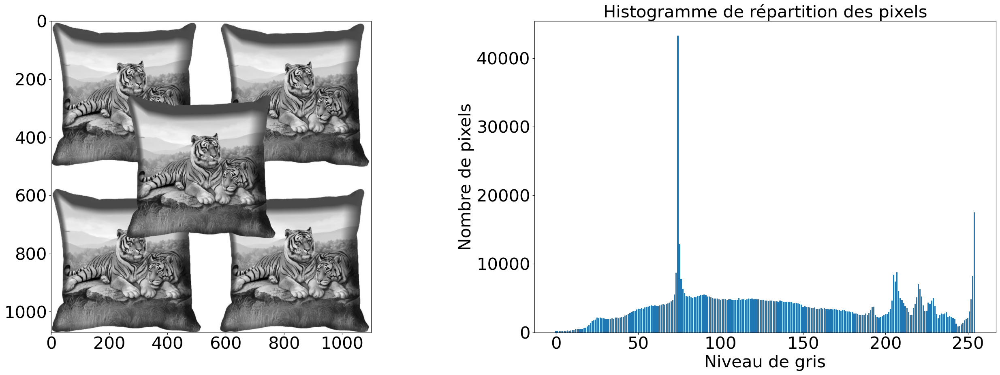

In [111]:
disp_img_hist(img)

### Auto contrast

In [112]:
img = ImageOps.autocontrast(img)

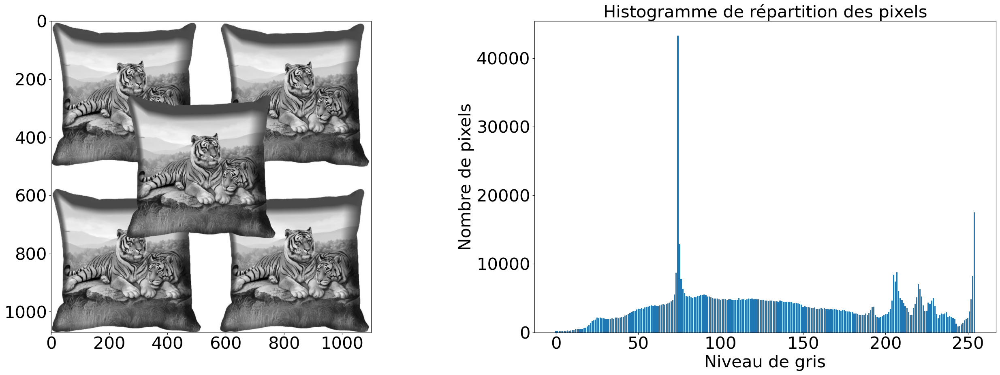

In [113]:
disp_img_hist(img)

In [114]:
img = ImageOps.equalize(img)

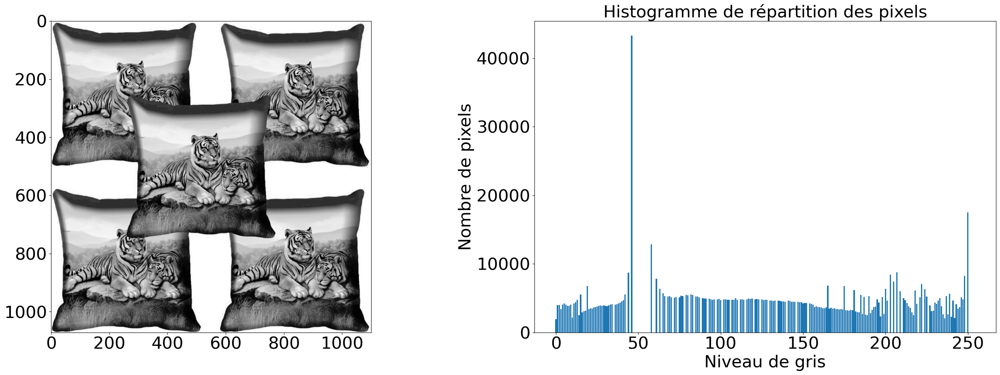

In [115]:
disp_img_hist(img)

In [116]:
from skimage import restoration, img_as_float

In [117]:
# Convert image to float
img_float = img_as_float(img)

# Apply non-local means denoising
denoised_img = denoise_nl_means(img_float, h=0.1)

# Convert denoised image back to uint8 format
img = (denoised_img * 255).astype('uint8')


Le débruitage n'est pas nécessairement utile, sur les idfférents samples réalisés, les images ne présentaient pas de bruit.

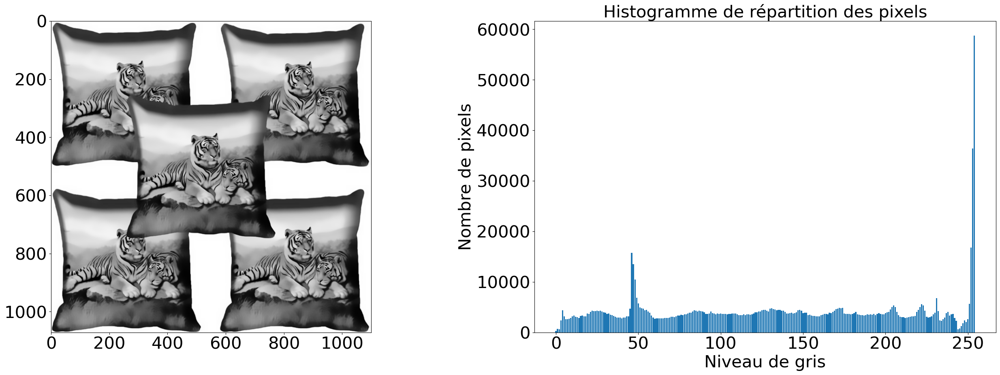

In [118]:
disp_img_hist(img)

In [119]:
# Resize
img = Image.fromarray(img)  # Convert NumPy array back to PIL Image
img = img.resize((256, 256))

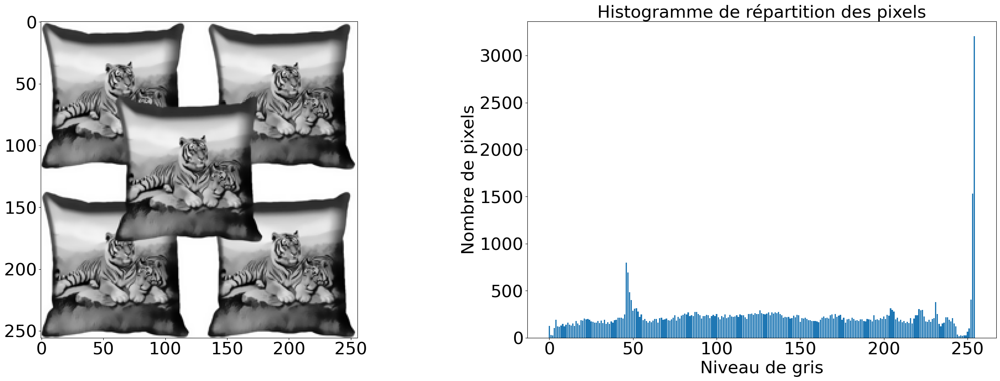

In [120]:
disp_img_hist(img)

## 1.4 Application à toutes les images

In [121]:
def process_image(path) :
    import os
    from IPython.display import display
    from PIL import Image, ImageOps
    from skimage import img_as_float
    from skimage.restoration import denoise_nl_means
    
    image = Image.open(path)
    
    # convert to grayscale
    img = image.convert('L')
    
    # Autocontrast
    img = ImageOps.autocontrast(img)
    
    # Equalize
    img = ImageOps.autocontrast(img)
    
    # Denoise
    img_float = img_as_float(img) # Convert image to float
    denoised_img = denoise_nl_means(img_float, h=0.1) # non-local means denoising
    img = (denoised_img * 255).astype('uint8') # Convert image back to uint8 format
    
    # Resize
    img = Image.fromarray(img)  # Convert NumPy array back to PIL Image
    img = img.resize((256, 256))
    
    # saving
    file_name = os.path.split(path)[1]
    output_path = os.path.join('Images_clean', file_name)
    
    # Save the processed image
    img.save(output_path)

In [122]:
from pandarallel import pandarallel

# Initialize pandarallel
pandarallel.initialize(progress_bar=True)

INFO: Pandarallel will run on 10 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


# %run -n
# Apply process_image() to all paths in parallel
data['image_path'].parallel_apply(process_image)

# 2. SIFT

## 2.1 Sur une image

In [123]:
img = cv.imread('Images_clean/112a8a56ee40ee31ea06fb7ff23b5c25.jpg')
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

In [124]:
sift = cv.SIFT_create()

keypoints, descriptors = sift.detectAndCompute(gray, None)

In [125]:
img_with_keypoints = cv.drawKeypoints(gray, keypoints, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_with_keypoints_pil = Image.fromarray(img_with_keypoints)

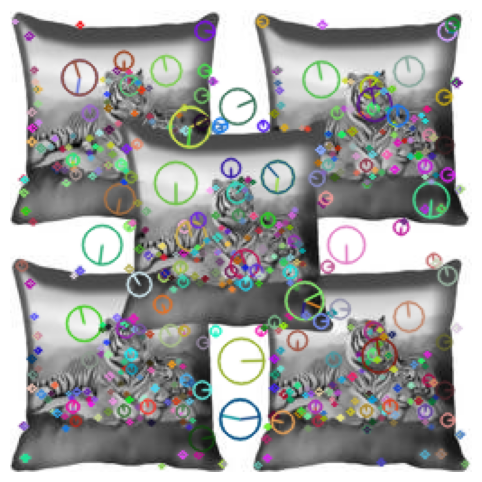

In [126]:
plt.figure(figsize=(8, 6))
plt.imshow(img_with_keypoints, cmap='gray')
plt.axis('off')
plt.show()

## 2.2 Autres exemples

In [127]:
print(random)

['Images/b52073e7ed9c00c4108cae4eb0c49c1a.jpg', 'Images/08613e8b27838b997069b1fedb6e88d2.jpg', 'Images/d218c32df572e82db50faecd62179db2.jpg', 'Images/621a88993a7033df3440ec816c2e386f.jpg', 'Images/6eaa9bd9e9285d77891bb76d30e6ebe7.jpg']


In [128]:
img = cv.imread('Images_clean/6f9c169adda9b562a841a9cf54b16f06.jpg')
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

In [129]:
sift = cv.SIFT_create()

keypoints, descriptors = sift.detectAndCompute(gray, None)

In [130]:
img_with_keypoints = cv.drawKeypoints(gray, keypoints, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_with_keypoints_pil = Image.fromarray(img_with_keypoints)

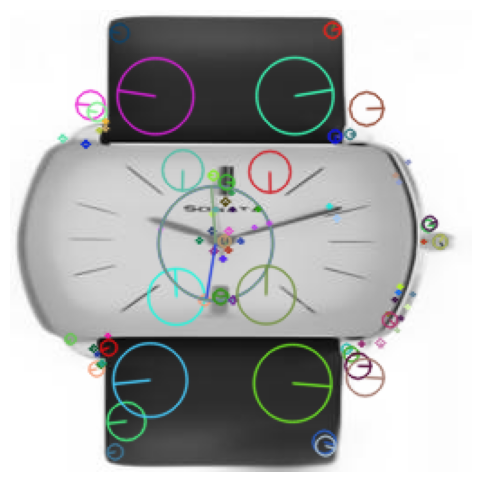

In [131]:
plt.figure(figsize=(8, 6))
plt.imshow(img_with_keypoints, cmap='gray')
plt.axis('off')
plt.show()

In [132]:
img = cv.imread('Images_clean/b6c339777814451815fe7950fd4c8536.jpg')
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

In [133]:
sift = cv.SIFT_create()

keypoints, descriptors = sift.detectAndCompute(gray, None)

In [134]:
img_with_keypoints = cv.drawKeypoints(gray, keypoints, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_with_keypoints_pil = Image.fromarray(img_with_keypoints)

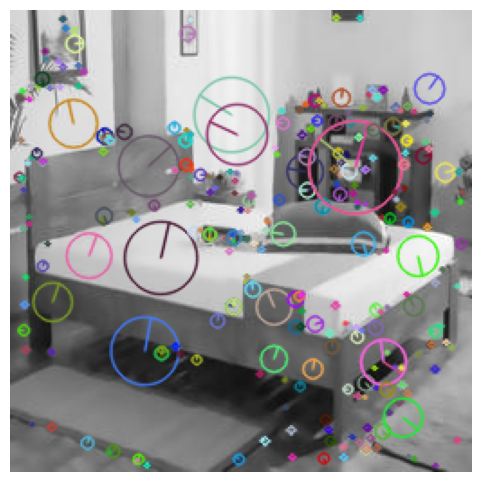

In [135]:
plt.figure(figsize=(8, 6))
plt.imshow(img_with_keypoints, cmap='gray')
plt.axis('off')
plt.show()

In [136]:
print(descriptors.shape)

(312, 128)


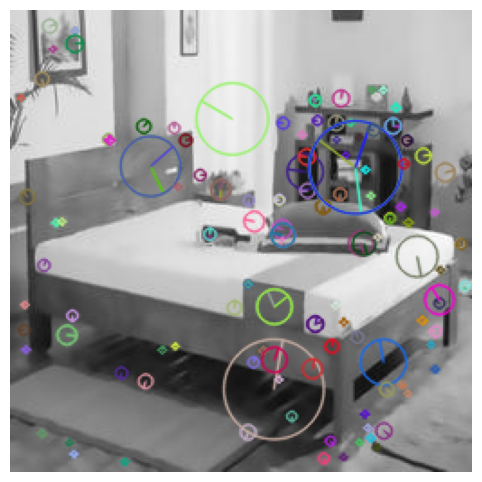

In [137]:
img = cv.imread('Images_clean/b6c339777814451815fe7950fd4c8536.jpg')
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

sift = cv.SIFT_create(nfeatures=1000, contrastThreshold=0.02, edgeThreshold=5, sigma=3)

keypoints, descriptors = sift.detectAndCompute(gray, None)
img_with_keypoints = cv.drawKeypoints(gray, keypoints, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_with_keypoints_pil = Image.fromarray(img_with_keypoints)

plt.figure(figsize=(8, 6))
plt.imshow(img_with_keypoints, cmap='gray')
plt.axis('off')
plt.show()

In [138]:
print(descriptors.shape)

(137, 128)


SIFT ne semble pas être la bonne méthode.  
En effet, le but ici n'est pas de reconnaître les mêmes objets dans des situations différentes, et les types d'image, de prise de vue, de présentation etc sont très hétérogènes. Les descripteurs ne sont pas caractéristiques d'une classe : par exemple les points d'intérêts detectés sur les coussins au motif de tigre n'apportent rien à la classification.

# 3. CNN

In [139]:
display(data.head())

,uniq_id,image_path,cat1
0,55b85ea15a1536d46b7190ad6fff8ce7,Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
1,7b72c92c2f6c40268628ec5f14c6d590,Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care
2,64d5d4a258243731dc7bbb1eef49ad74,Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care
3,d4684dcdc759dd9cdf41504698d737d8,Images/d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing
4,6325b6870c54cd47be6ebfbffa620ec7,Images/6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing


In [141]:
category_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

# Print the mapping
print("Category Mapping:")
for category, encoded_value in category_mapping.items():
    print(f"{category}: {encoded_value}")

Category Mapping:
Baby Care: 0
Beauty and Personal Care: 1
Computers: 2
Home Decor & Festive Needs: 3
Home Furnishing: 4
Kitchen & Dining: 5
Watches: 6


## 3.1 FONCTIONS

In [142]:
def visualisations(features):
    
    from sklearn import manifold, decomposition
    
    # Dimension reduction using PCA
    print('Shape avant PCA :', features.shape)
    pca = decomposition.PCA(n_components=0.99)
    feat_pca= pca.fit_transform(features)
    print('Shape après PCA :', feat_pca.shape)
    
    print(' ')
    print('------------------')
    print(' ')
    
    #TSNE
    temps1 = time.time()
    tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=3000, init='random', random_state=6, early_exaggeration = 20)
    X_tsne = tsne.fit_transform(feat_pca)
    duration1=time.time()-temps1
    print("temps de T-SNE : ", "%15.2f" % duration1, "secondes")
    
    print(' ')
    print('------------------')
    print(' ')
    
    # Affichage TSNE
    
    df_tsne = pd.DataFrame(X_tsne, columns=['tsne1', 'tsne2'])
    df_tsne["class"] = data["cat1"]

    plt.figure(figsize=(8,5))
    sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="class",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

    plt.title('TSNE selon les vraies classes', fontsize = 30, pad = 35, fontweight = 'bold')
    plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
    plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
    plt.legend(prop={'size': 14}, bbox_to_anchor=(1.05, 1), loc='upper left') 

    plt.show()
    
    print(' ')
    print('------------------')
    print(' ')
    
    # Agglomerative clustering
    from sklearn.cluster import AgglomerativeClustering
    cls = AgglomerativeClustering(n_clusters=7)
    cls.fit(X_tsne)
    
    # Display TSNE with predicted labels
    df_tsne["cluster"] = cls.labels_

    plt.figure(figsize=(8,5))
    sns.scatterplot(
        x="tsne1", y="tsne2",
        hue="cluster",
        palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
        data=df_tsne,
        legend="brief")

    plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
    plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
    plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
    plt.legend(prop={'size': 14}) 

    plt.show()

    labels = data_T["label"]
    print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))
    

    print(' ')
    print('------------------')
    print(' ')
    
    conf_mat = metrics.confusion_matrix(labels, cls.labels_)
    print('Confusion matrix, désordonnée :')
    print(conf_mat)
    
    print(' ')
    print('------------------')
    print(' ')
    
    cm = conf_mat
    indexes = linear_sum_assignment(_make_cost_m(cm))
    js = [e[1] for e in sorted(zip(indexes[0], indexes[1]), key=lambda x: x[0])]
    cm2 = cm[:, js]
    print('Confusion matrix, ordonnée :')
    print(cm2)

    print(' ')
    print('------------------')
    print(' ')
    
    print('Matrice de confusion')
    df_cm = pd.DataFrame(cm2, index = [label for label in list_labels],
                  columns = [i for i in "0123456"])
    plt.figure(figsize = (8,5))
    sns.heatmap(df_cm, annot=True, fmt='d', cmap="Blues")


    

## 3.2 VGG16

In [143]:
base_model = VGG16()
model = Model(inputs=base_model.inputs, outputs=base_model.layers[-2].output)

print(model.summary())

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 134,260,544 (512.16 MB)

 Trainable params: 134,260,544 (512.16 MB)

 Non-trainable params: 0 (0.00 B)

None


### Création des features des images

In [144]:
images_features = []
i=0 
for image_file in data["image_path"] :
    if i%100 == 0 : print(i)
    i +=1
    image = load_img(image_file, target_size=(224, 224))
    image = img_to_array(image) 
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    images_features.append(model.predict(image, verbose=0)[0]) # predict from pretrained model

images_features = np.asarray(images_features)
print(images_features.shape)

0
100
200
300
400
500
600
700
800
900
1000
(1050, 4096)


Shape avant PCA : (1050, 4096)
Shape après PCA : (1050, 803)
 
------------------
 
temps de T-SNE :             8.94 secondes
 
------------------
 


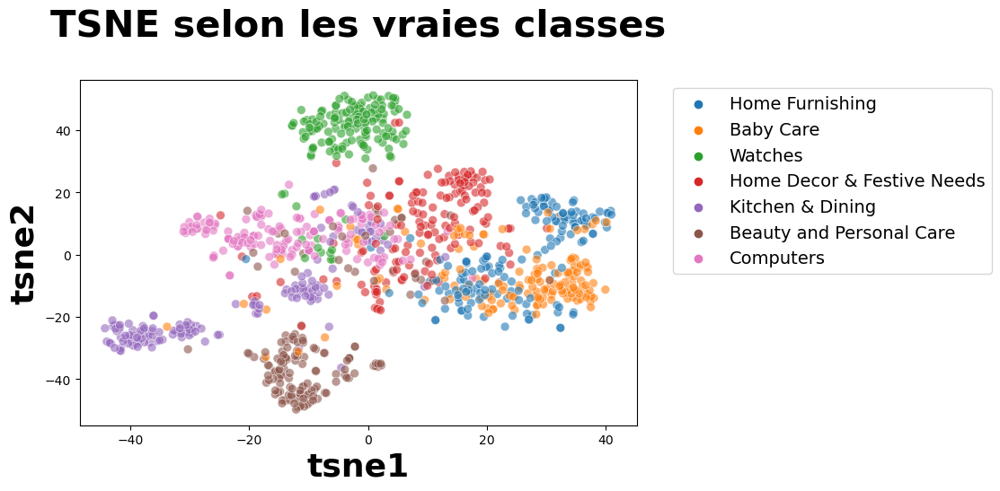

 
------------------
 


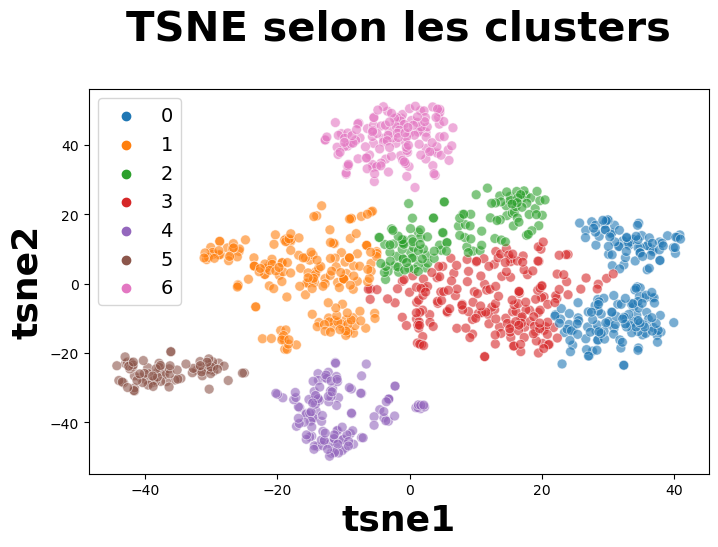

ARI :  0.442363059428657
 
------------------
 
Confusion matrix, désordonnée :
[[ 95   5   6  40   3   1   0]
 [  3   8   9  12 116   1   1]
 [  0 113  23  14   0   0   0]
 [  1   8  73  64   1   0   3]
 [ 87   1   0  62   0   0   0]
 [  0  49  15   5   3  78   0]
 [  0  10   2   2   0   0 136]]
 
------------------
 
Confusion matrix, ordonnée :
[[ 95   3   5   6  40   1   0]
 [  3 116   8   9  12   1   1]
 [  0   0 113  23  14   0   0]
 [  1   1   8  73  64   0   3]
 [ 87   0   1   0  62   0   0]
 [  0   3  49  15   5  78   0]
 [  0   0  10   2   2   0 136]]
 
------------------
 
Matrice de confusion


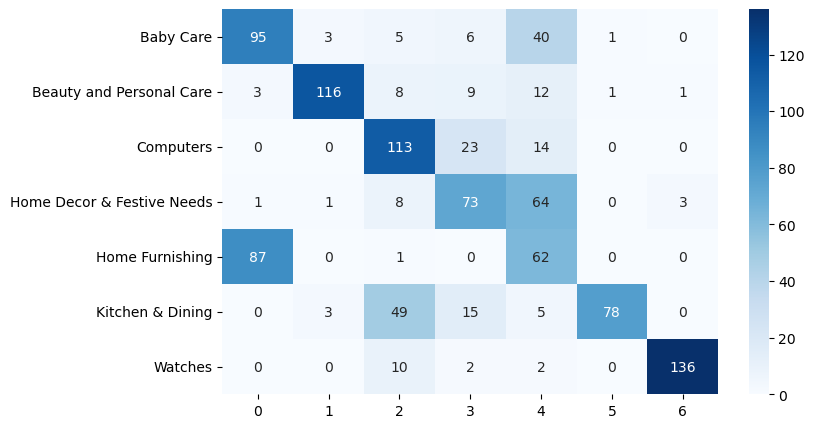

In [145]:
visualisations(images_features)

## 3.3 Efficient Net

In [146]:
from tensorflow.keras.applications import EfficientNetB0

In [147]:
# Load EfficientNet model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Create a new model using the penultimate layer (the second-to-last layer) as output
model = Model(inputs=base_model.inputs, outputs=base_model.layers[-2].output)

# Print the summary of the new model
print(model.summary())


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_3[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,049,571 (15.45 MB)

 Trainable params: 4,007,548 (15.29 MB)

 Non-trainable params: 42,023 (164.16 KB)

None


### Création des features des images

In [148]:
images_features = []
i=0 
for image_file in data["image_path"] :
    if i%100 == 0 : print(i)
    i +=1
    image = load_img(image_file, target_size=(224, 224))
    image = img_to_array(image) 
    image = np.expand_dims(image, axis=0)
    image = preprocess_input(image)
    images_features.append(model.predict(image, verbose=0)[0]) # predict from pretrained model

images_features = np.asarray(images_features)
print(images_features.shape)

0
100
200
300
400
500
600
700
800
900
1000
(1050, 7, 7, 1280)


In [149]:
images_features = images_features.reshape(images_features.shape[0], -1)

Shape avant PCA : (1050, 62720)
Shape après PCA : (1050, 873)
 
------------------
 
temps de T-SNE :             7.93 secondes
 
------------------
 


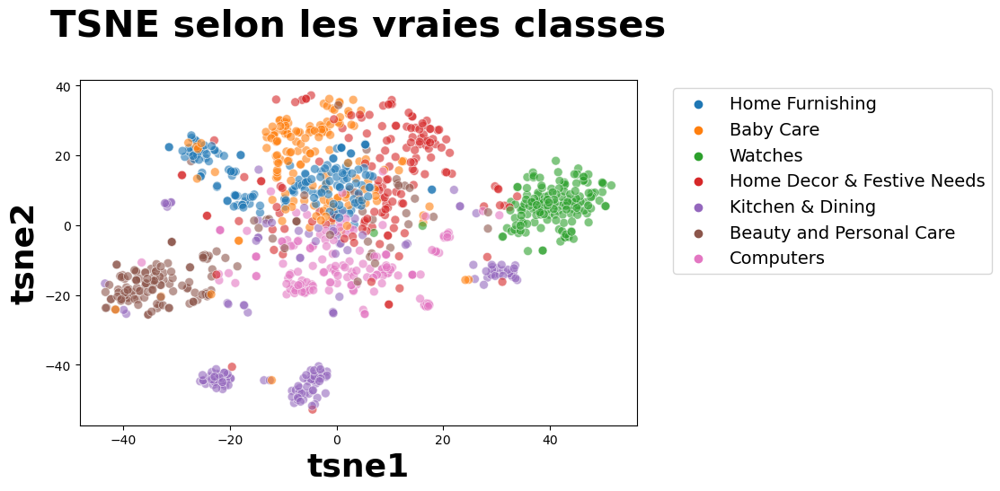

 
------------------
 


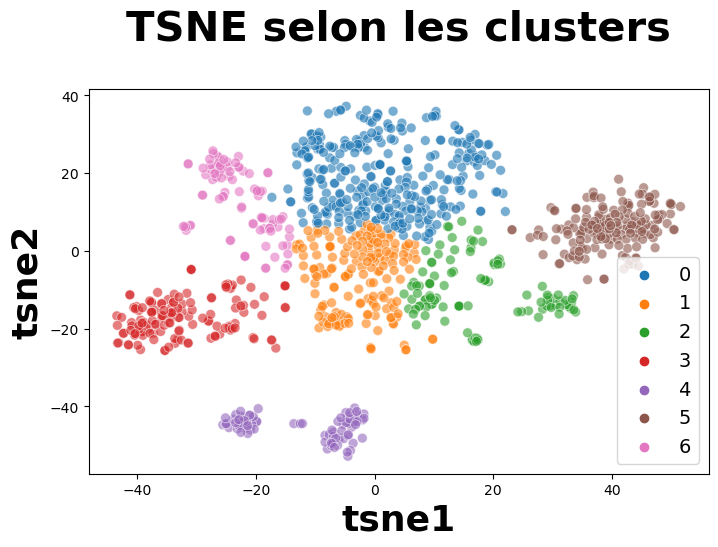

ARI :  0.39497066156489347
 
------------------
 
Confusion matrix, désordonnée :
[[118  14   5   3   1   0   9]
 [ 11  11   8 115   0   2   3]
 [  3  81  50  10   0   2   4]
 [ 98  22  13   1   2   8   6]
 [ 79  11   0   0   0   0  60]
 [  2  22  27   8  78   3  10]
 [  0   1   1   0   0 148   0]]
 
------------------
 
Confusion matrix, ordonnée :
[[118   3  14   5   9   1   0]
 [ 11 115  11   8   3   0   2]
 [  3  10  81  50   4   0   2]
 [ 98   1  22  13   6   2   8]
 [ 79   0  11   0  60   0   0]
 [  2   8  22  27  10  78   3]
 [  0   0   1   1   0   0 148]]
 
------------------
 
Matrice de confusion


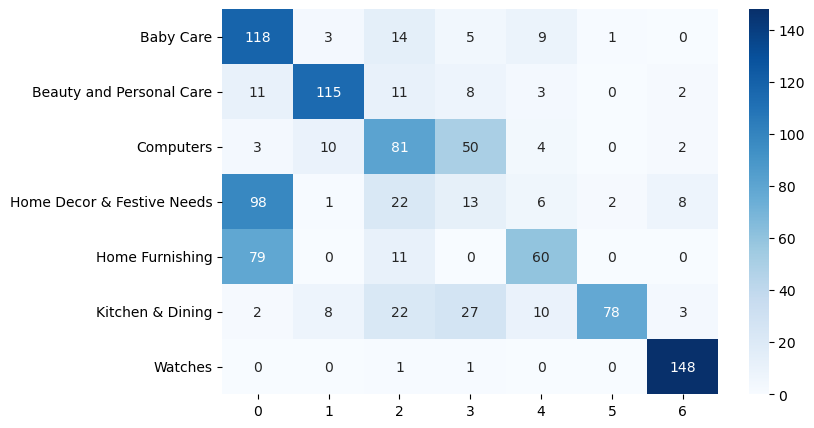

In [150]:
visualisations(images_features)

## 3.4 Combined

In [151]:
features_USE = np.load('features_USE.npy')

In [152]:
print(features_USE.shape)

(1050, 512)


In [153]:
print(images_features.shape)

(1050, 62720)


In [154]:
combined_features = np.concatenate((features_USE, images_features), axis=1)

In [155]:
print(combined_features.shape)

(1050, 63232)


Shape avant PCA : (1050, 63232)
Shape après PCA : (1050, 873)
 
------------------
 
temps de T-SNE :             9.98 secondes
 
------------------
 


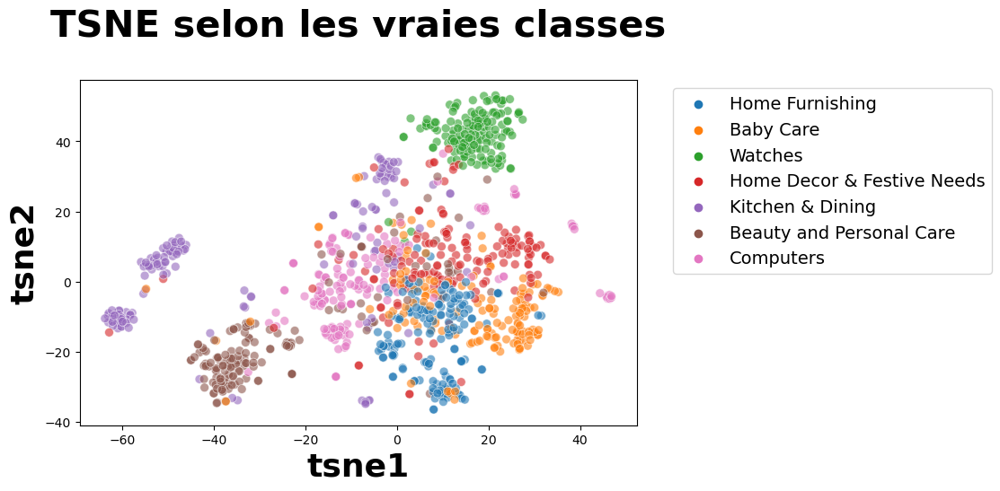

 
------------------
 


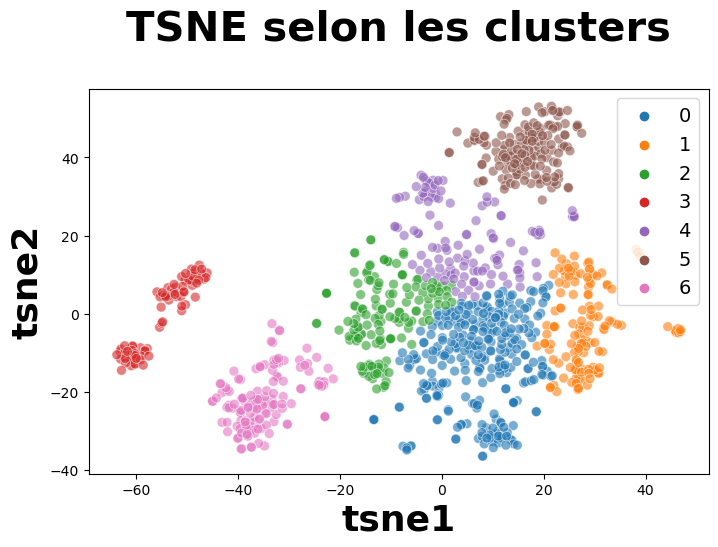

ARI :  0.42445987141525093
 
------------------
 
Confusion matrix, désordonnée :
[[ 60  69   6   1  11   0   3]
 [ 14   2  11   0   8   1 114]
 [  9  16  98   0  21   1   5]
 [ 51  42  12   2  35   7   1]
 [141   5   1   0   3   0   0]
 [ 11   0  14  78  38   0   9]
 [  0   0   0   0   3 147   0]]
 
------------------
 
Confusion matrix, ordonnée :
[[ 69   3   6  11  60   1   0]
 [  2 114  11   8  14   0   1]
 [ 16   5  98  21   9   0   1]
 [ 42   1  12  35  51   2   7]
 [  5   0   1   3 141   0   0]
 [  0   9  14  38  11  78   0]
 [  0   0   0   3   0   0 147]]
 
------------------
 
Matrice de confusion


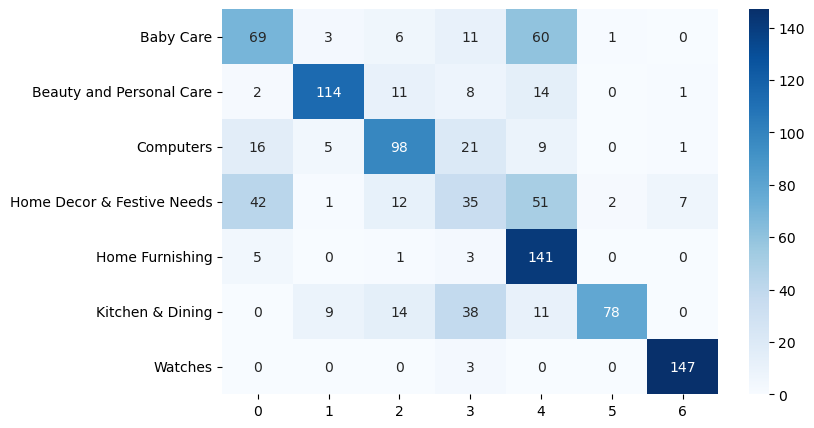

In [156]:
visualisations(combined_features)

### Perspectives : 
On voit que le résultat de 'combined' est plutôt satisfaisant, mais, peu importe le modèle, peu importe si l'on étudie les textes, les images, ou les deux, les modèles proposés sont performants pour certaines catégories, mais pas pour toutes. Ce qui est intéressant, c'est que certains modèles reconnaissent très bien des catégories spécifiques : par exemple Computers, Kitchen & Dining, etc.  
A ce stade de l'étude, on pourrait recommander un modèle hybride en appliquant successivement différents algos pour prédire les différentes catégories. Par exemple commencer par le USE pour reconnaître les ordinateurs, éliminer les ordinateurs du dataset, puis utiliser le modèle 'combined' pour reconnaître Kitchen&Dining, éliminer les produits, etc.  
On obtiendrait alors une classification assez fiable.

In [157]:
data.to_csv('data2.csv', index=False)